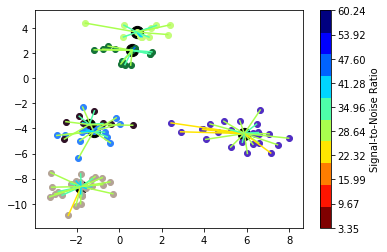

0.7843797206878662
{'Cluster Head': 'client1', 'Members': ['client6', 'client7', 'client14', 'client16', 'client19', 'client21', 'client53', 'client62'], 'SNR': [29.766222162062327, 28.4777653079774, 29.618903913404232, 37.33537606003176, 34.17559113463845, 26.42310179939658, 23.85734534005961, 28.19850245064484], 'CSI': [0.575252622267468, 0.4924253543193199, 0.39064086414334964, 0.13171527363881996, 0.9264667462414024, 0.04055787797618671, 0.3389324779941715, 0.8757883173060108]}


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
import syft as sy
import numpy as np
from Dataset import load_dataset, getImage
from utils import averageModels
from utils import averageModelscluster
import random
import math
import matplotlib.pyplot as plt
from ipynb.fs.full.K_clusters import cluster_former
from copy import deepcopy

In [2]:
P=2 #signal power threshold
#stream = BitStream()
#random.seed(10)
key=[]
for i in range (10000): #generating a random password to activate training (Pilot signal)
    temp=random.randint(0,1)
    key.append(temp)

key1=[0]*len(key)
for i in range (len(key)):   #bpsk modulation
    if(key[i]==1):
        #print("yay")
        key1[i]=-math.sqrt(P)
    else:
        key1[i]=math.sqrt(P)

#print(key)
        
key_np=np.array(key1)

In [3]:
class Arguments():
    def __init__(self):
        self.images = 10000
        self.clients = 50
        self.rounds = 200
        self.epochs = 5
        self.local_batches = 64
        self.lr = 0.01
        self.C = 1 #fraction of clients used in the round
        self.drop_rate = 0 #fraction of devices in the selected set to be dropped for various reasons
        self.torch_seed = 0 #same weights and parameters whenever the program is run
        self.log_interval = 64
        self.iid = 'noniid'
        self.split_size = int(self.images / self.clients)
        self.samples = self.split_size / self.images 
        self.use_cuda = False
        self.save_model = True
        self.numclusters=5

args = Arguments()

In [4]:
#checking if gpu is available
#use_cuda = args.use_cuda and torch.cuda.is_available()
use_cuda=False
device = torch.device("cuda:0" if use_cuda else "cpu")
kwargs = {'num_workers': 1, 'pin_memory': True} if use_cuda else {}

hook = sy.TorchHook(torch)
me = hook.local_worker
clients = []

#generating virtual clients
for i in range(args.clients):
    clients.append({'hook': sy.VirtualWorker(hook, id="client{}".format(i+1))})
#print(clients)

In [5]:
global_train, global_test, train_group, test_group = load_dataset(args.clients, args.iid) #load data

for inx, client in enumerate(clients):  #return actual image set for each client
    trainset_ind_list = list(train_group[inx]) 
    client['trainset'] = getImage(global_train, trainset_ind_list, args.local_batches)
    client['testset'] = getImage(global_test, list(test_group[inx]), args.local_batches)
    client['samples'] = len(trainset_ind_list) / args.images #useful while taking weighted average


/home/test/anaconda3/lib/python3.7/site-packages/torchvision/datasets/mnist.py:45: UserWarning: train_labels has been renamed targets
  warnings.warn("train_labels has been renamed targets")


In [6]:
#load dataset for global model (to compare accuracies)
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307,), (0.3081,))])
global_test_dataset = datasets.MNIST('./', train=False, download=True, transform=transform)
# global_test_dataset = torch.utils.data.random_split(global_test_dataset, [10000, len(global_test_dataset)-10000])[0]
global_test_loader = DataLoader(global_test_dataset, batch_size=args.local_batches, shuffle=True)

In [7]:
"""class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        #self.quant = torch.quantization.QuantStub()
        self.conv1 = nn.Conv2d(1, 5, 5, 1)
        self.conv2 = nn.Conv2d(5, 10, 5, 1)
        self.fc1 = nn.Linear(4*4*10, 50) #10 iid #50 non iid
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        #x=self.quant(x)
        x = F.relu(self.conv1(x))
        x = F.max_pool2d(x, 2, 2)
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x, 2, 2)
        x = x.view(-1, 4*4*10
                   )
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return F.log_softmax(x, dim=1) """

class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x)

In [8]:
def fedprox(params,global_params):
    global_param=[]
    ind=0
    for gp in global_params:
        global_param.append(gp)
    for p in params:
    #                 print(p.grad)
        lr=0.001
        mu=0.1
        if(p.grad is None):
            continue
        grad=p.grad.data #batch gradients
        p.data.sub_(lr,(grad+mu*(p.data.clone()-global_param[ind].data.clone())))
        ind+=1
    return(p)

In [9]:
def ClientUpdate(args, device, client,key_np,key,snr,csi,mu,head):
    gc=False
    client['model'].train()
    #simulating a wireless channel
    poptim=max((1/mu-1/csi),0)
    #print(mu,csi)
    print("Power Allocated=",poptim)
    print("CSI=",csi)
    
    snr__=10**(snr/10)
    
    absh=csi*poptim/snr__
    x=random.uniform(0,absh)
    #print(x)
    y=math.sqrt(absh*absh-x*x)
    #x=x*100
    #y=y*100
    #x=random.random()
    #y=random.random()
    #snr=10*math.log(poptim/(std*std),10)
    std=math.sqrt(poptim/snr__*absh*absh) #channel noise
    
    #print(x,y)
    h=complex(x,y)
    #std=math.sqrt(abs(h)/csi)
    #snr=poptim/(std*std)
    #print(std)
    print("SNR=",snr)
    #print("csi",abs(h)/(std*std))
    
    
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data

    
    #print(client['model'].conv1.weight.size)
    client['model'].send(client['hook'])
    head['model'].send(client['hook'])
    print("Client:",client['hook'].id)
    
    key_np_received=h*key_np+(np.random.randn(len(key_np))*std*2)
    #print(key_np_received)
    key_np_received=(key_np_received/(h)).real
    
    for o in range (len(key_np_received)):  #demodulation bpsk
        if(key_np_received[o]>=0):
            key_np_received[o]=0
        else:
            key_np_received[o]=1
    
    key_np_received=key_np_received.tolist()
    key_np_received = [int(item) for item in key_np_received]
    #key_np=key_np.tolist()
    
    
    if(sum(np.bitwise_xor(key,key_np_received))/len(key)==0 and poptim>0): #...............................................checking if channel is good enough for transmission by checking BER..................................#
        gc=True #considering the client model for training
        for epoch in range(1, args.epochs + 1):
            for batch_idx, (data, target) in enumerate(client['trainset']): 
                data = data.send(client['hook'])
                target = target.send(client['hook'])
                #client['optim'].zero_grad()
                #train model on client
                data, target = data.to(device), target.to(device) #send data to cpu/gpu (data is stored locally)
                output = client['model'](data)
                loss = F.nll_loss(output, target)
                loss.backward()
                #client['optim'].step()
                params=client['model'].parameters()
                gp=head['model'].parameters()
                params=fedprox(params,gp) 
                
                if batch_idx % args.log_interval == 0:
                    loss = loss.get() 
                    print('Model {} Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                        client['hook'].id,
                        epoch, batch_idx * args.local_batches, len(client['trainset']) * args.local_batches, 
                        100. * batch_idx / len(client['trainset']), loss))
    else:
        print("Poor Channel, client not taken for averaging in this round")
            
                    
    client['model'].get()
    head['model'].get()
    # print()
         #CHANGE
    if(poptim!=0):
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
    #CHANGE ENDS
    print()
    return gc

In [10]:
def test(args, model, device, test_loader, name,fed_round):
    model.eval()    #no need to train the model while testing
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            if(use_cuda and fed_round==0):
                data,target=data.cuda(),target.cuda()
                #model.cuda()
            else:
                data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item() # sum up batch loss
            pred = output.argmax(1, keepdim=True) # get the index of the max log-probability 
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss for {} model: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        name, test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    
    return([100. * correct / len(test_loader.dataset),test_loss])

In [11]:
torch.manual_seed(args.torch_seed)

In [12]:
def distort(neighbours,snrs):
    ind=0
    poptim=2
    csi=random.random()
    distorted_models=[]
    for client in neighbours:
        snr=snrs[ind]
        ind+=1
        snr__=10**(snr/10)
        absh=csi*poptim/snr__
        x=random.uniform(0,absh)
        y=math.sqrt(absh*absh-x*x)
        std=math.sqrt(poptim/snr__*absh*absh) #channel noise
        h=complex(x,y)
        data=client['model'].conv1.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        #print(power)
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv1.weight.data=data
        
        
        
        data=client['model'].conv2.weight
        #data=data.cuda()
        data=data*math.sqrt(poptim) #transmitted signal
        if(use_cuda):
            data=h*data+(torch.randn(data.size())*std).cuda() #channel affecting data
        else:
            data=h*data+(torch.randn(data.size())*std)
        data=data/(math.sqrt(poptim)*(h))  #demodulating received data
        data=data.real #demodulating received data
        client['model'].conv2.weight.data=data
        
        distorted_models.append(client)
    return(distorted_models)
        

In [13]:
def decentralized(clients,snrs,weights):
    big_daddy_of_distorted_models=[]
    for client in clients:
        distorted_models=[]
        snr_list=[]
        for snr in snrs:
            if(client['hook'].id in snr):
                snr_list.append(snr[2])
        neighbours_c = [x for x in clients if x != client]
        neighbours={}
        jjj=[jkl for jkl in range(len(neighbours_c))]
        
        dictionary = dict(zip(jjj, neighbours_c))
        #for jjj in range(len(neighbours_c)):
        #   neighbours[jjj].append(neighbours_c[jjj])
        distorted_models=distort(neighbours,snr_list)
        distorted_models.append(client)
        big_daddy_of_distorted_models.append(distorted_models)
    
    
    weight_final1=[]
    for oho in big_daddy_of_distorted_models:
        weight_final=[]
        for comeon in oho:
            for w in weights:
                if(comeon['hook'].id==w[0]):
                    weight_final.append(w[1])
        weight_final1.append(weight_final)
    
    final_heads=[]
    nets=[]
    ind=0
    for client in clients:
        for oof in big_daddy_of_distorted_models:
            if(client==oof[0]):
#                 print(client)
#                 print("shut up")
#                 print(distorted_models)
#                 print("shut up")
#                 print(weight_final1)
                
                overall=Net()
                overall=averageModelscluster(overall,distorted_models,weight_final1[ind])
                client['model'].load_state_dict(overall.state_dict())
                ind+=1
                final_heads.append(client)
                nets.append(overall)
    
    return(final_heads,nets)
        
            
            

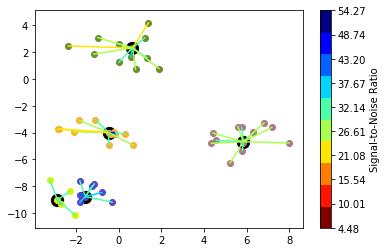

0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/generic/frameworks/hook/hook.py:165: UserWarning: This overload of sub_ is deprecated:
	sub_(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	sub_(Tensor other, *, Number alpha) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  response = method(*a

Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299490
Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.204291
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.191868
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.059123
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.905080

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290046
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.193412
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.864650
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.975136
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.818956

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308713
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.238054
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.218626
Model client15 Train Epoch: 4 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.301078
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.244660
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.160582
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.181993

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.323003
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.261645
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.181748
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.197007
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.978814

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

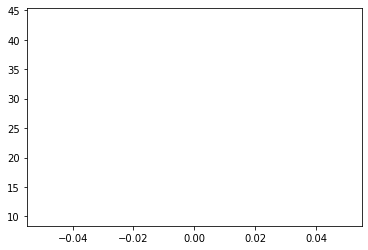

ROUND 0
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299985


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.276042
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.258172
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.150724
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.969521

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301004
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.244806
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.030511
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.125769
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.748415

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.295288
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.262348
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.217886
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.984639
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.296094
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.265886
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.190204
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.066054

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301884
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.278548
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.219339
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.005467
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.696836

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

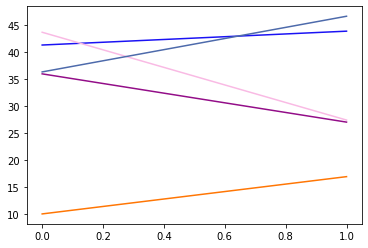

ROUND 1
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297298


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.245058
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.139206
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.730906
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.378927

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298304
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.231619
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.969923
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.742869
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.532892

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304554
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.234353
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.164052
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.815703
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.283127
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.029935
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.815017
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.263805

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293596
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.228734
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.087853
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.966209
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.391019

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

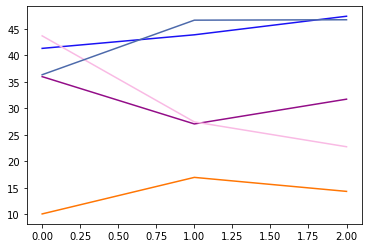

ROUND 2
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290775


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.252426
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.237859
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.108421
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.044849

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302686
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.189303
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.089199
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.485265
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.401028

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.295991
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.219755
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.075302
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.665098
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.281920
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.205272
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.945353
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.991868

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298931
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.224177
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.080679
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.755993
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.706642

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

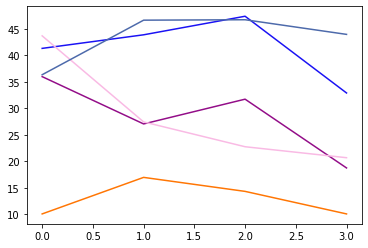

ROUND 3
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.283731


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.220320
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.105426
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.760438
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.785284

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287839
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.148266
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.910304
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.809597
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.550121

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.309299
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.195917
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.149237
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.982848
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.258147
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.155570
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.061047
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.570950

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294728
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.218445
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.009423
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.653864
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.433832

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

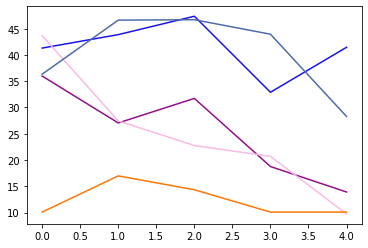

ROUND 4
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284968


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.168788
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.108176
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.695125
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.068249

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286143
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.128928
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.909084
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.774262
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.688250

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300112
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.135093
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.130546
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.885165
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.273727
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.077768
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.811156
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.815012

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.275911
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.201025
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.068664
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.879616
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.483808

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

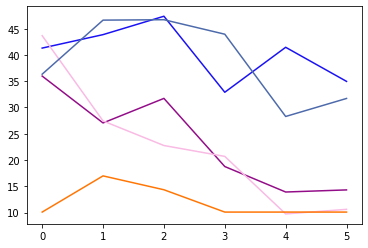

ROUND 5
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287401


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.195748
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.105787
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.029043
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.812569

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.285481
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.092331
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.011097
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.819827
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.587195

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287439
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.203045
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.996926
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.758828
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.262136
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.198587
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.077862
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.552869

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279192
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.218275
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.122434
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.730271
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.341099

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

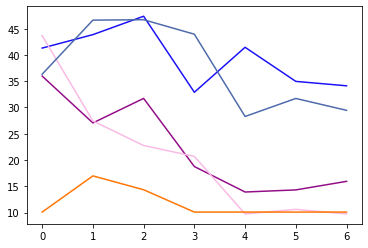

ROUND 6
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276198


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.151786
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.024717
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.725306
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.617270

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.310905
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.084996
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.757087
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.571790
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.481008

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.332612
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.186108
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.948585
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.502609
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.258479
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.177257
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.762255
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.871598

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268088
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.169152
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.838944
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.306444
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.773352

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

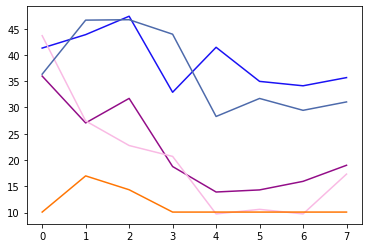

ROUND 7
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294281


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.232222
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.174224
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.981918
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.727721

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300649
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.146223
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.031248
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.819354
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.942810

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300207
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.146634
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.953633
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.470642
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.326936
Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.257512
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.167161
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.984771
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.946168

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.269042
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.175990
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.264782
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.069821
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.106784

Power Allocated= 9.4

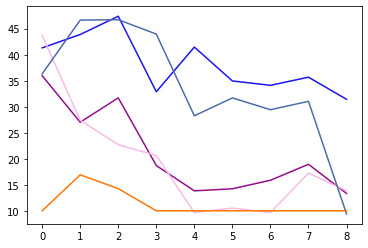

ROUND 8
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.274939


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.264755
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.163241
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.987975
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.370011

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.316032
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.147755
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.986551
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.704951
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.391006

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.311567
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.172400
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.864359
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.792137
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.290951
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.122656
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.775107
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.748860

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.267005
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.175425
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.005175
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.781708
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.733649

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

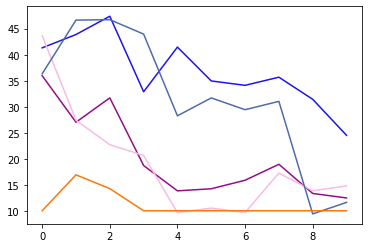

ROUND 9
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287138


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.191953
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.799003
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.754463
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.310958

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290350
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.082372
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.694954
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.387974
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.105752

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306261
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.152349
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.091481
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.564931
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.234582
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.048941
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.597661
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.751658

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292126
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.154558
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.960246
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.509878
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.607090

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

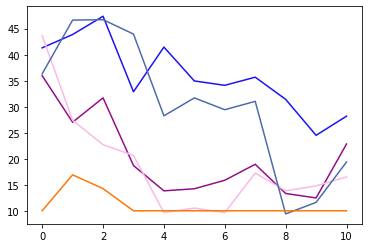

ROUND 10
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.314390


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.197699
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.243090
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.053257
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.724282

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.329613
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.113995
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.916676
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.442356
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.555902

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.316236
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.194698
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.884804
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.362711
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.258974
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.170974
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.839373
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.672017

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281751
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.140213
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.160192
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.797016
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.793871

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

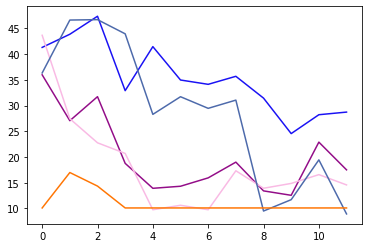

ROUND 11
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.271846


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.256087
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.047699
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.763059
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.248106

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.331357
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.110353
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.966220
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.641517
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.141964

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302961
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.153535
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.007388
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.501472
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.242819
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.987153
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.540032
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.767584

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.258789
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.180814
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.040444
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.917739
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.058799

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

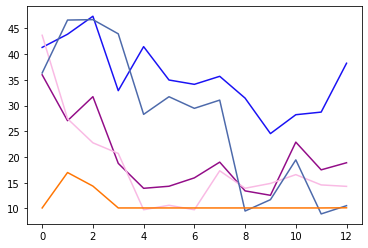

ROUND 12
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286728


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.187634
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.976537
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.793912
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.082380

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.319631
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.068830
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.766877
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.498013
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.800588

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308010
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.070266
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.950752
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.272950
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.242763
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.081939
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.815626
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.924921

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270606
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.141955
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.046216
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.914934
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.973588

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

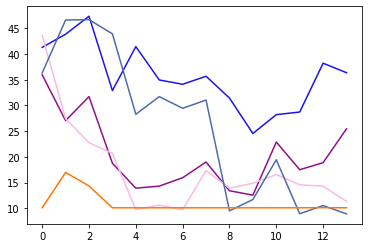

ROUND 13
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290065


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.160813
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.116941
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.042211
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.673871

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290068
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.071092
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.788099
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.386557
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.708015

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282043
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.168614
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.057114
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.872423
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.188117
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.751918
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.486735
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.140898

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.254291
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.115354
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.947441
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.701830
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.575171

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

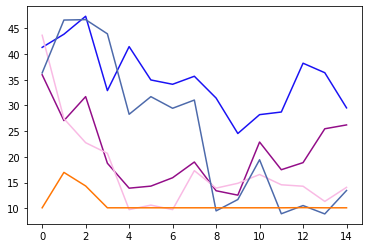

ROUND 14
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.333841


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.251558
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.865131
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.825214
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.007105

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291804
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.108075
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.782607
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.821783
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.404639

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.313563
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.059880
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.864811
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.359184
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.277617
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.265316
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.484188
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.507846

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.263656
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.144341
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.996110
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.578627
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.697841

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

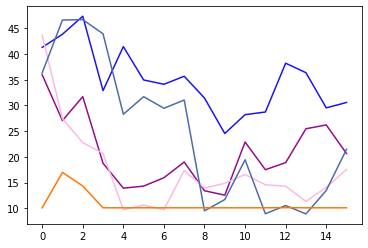

ROUND 15
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292075


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.188668
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.096619
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.169062
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.426298

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308902
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.096607
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.808691
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.666165
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.488124

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.275043
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.227533
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.044674
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.725570

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.232361
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.147230
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.934820
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.752866
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.547544

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

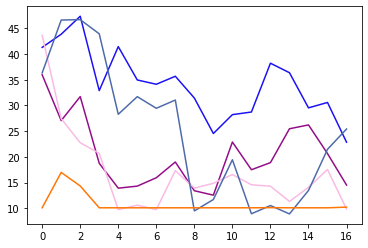

ROUND 16
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277468


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.184469
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.074105
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.664296
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.558534

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.342560
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.037864
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.770368
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.310091
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.403434

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.317776
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.081675
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.935419
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.448329
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.240062
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.144152
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.685787
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.789411

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268409
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.135051
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.925091
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.674280
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.577419

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

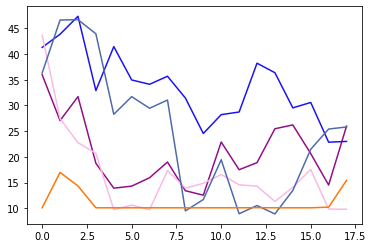

ROUND 17
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.255374


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.233874
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.231828
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.991944
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.943450

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270457
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.038745
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.798664
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.140448
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.438837

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301270
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.184291
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.918442
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.564896
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.242645
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.921442
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.846099
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.323303

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259616
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.163242
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.918147
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.649408
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.275745

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

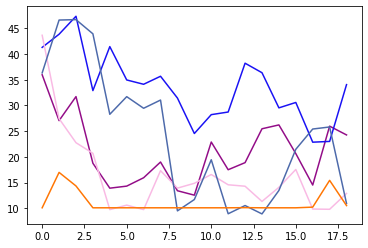

ROUND 18
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.295483


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.186039
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.134292
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.986252
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.830215

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284269
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.069719
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.806700
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.337712
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.381384

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.357247
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.047176
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.793833
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.505660
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.264438
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.160722
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.882281
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.616352

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.245015
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.097310
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.996051
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.675419
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.443530

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

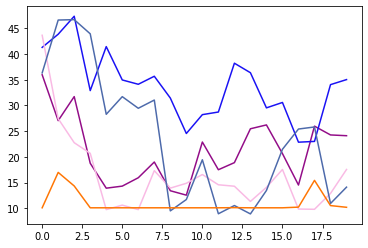

ROUND 19
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286767


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.139867
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.015666
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.849635
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.685623

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293863
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.009672
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.546964
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.372481
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.523975

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308915
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.095098
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.880446
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.398261
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.226066
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.895954
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.657472
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.183401

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281773
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.081833
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.686285
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.358896
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.383353

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

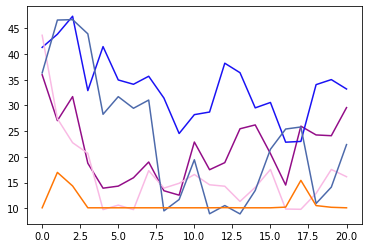

ROUND 20
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.236924


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.231046
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.976948
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.849957
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.541896

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293275
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.093745
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.860490
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.682149
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.099116

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.348673
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.004852
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.798116
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.433549
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.207282
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.951338
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.189219
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.696368

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.265997
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.166746
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.950969
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.818083
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.083967

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

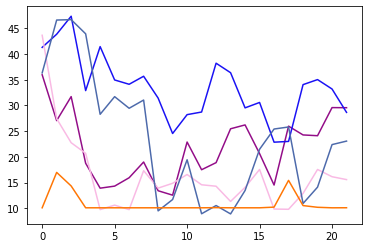

ROUND 21
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.273995


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.137464
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.924945
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.547427
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.792340

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268224
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.119342
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.525637
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.296569
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.765362

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308230
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.127161
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.753989
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.485358
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.225219
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.060657
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.728782
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.742088

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268328
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.073278
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.985464
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.613668
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.692299

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

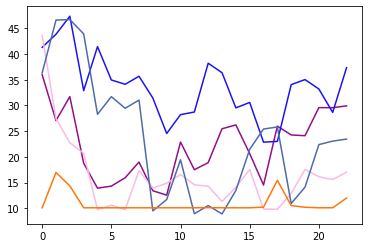

ROUND 22
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.274848


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.231668
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.117436
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.721236
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.107268

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304904
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.906685
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.507474
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.322256
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.123749

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.365795
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.081881
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.784801
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.225241
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.159053
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.760534
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.781859
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.736770

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276715
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.091045
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.919871
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.434150
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.604044

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

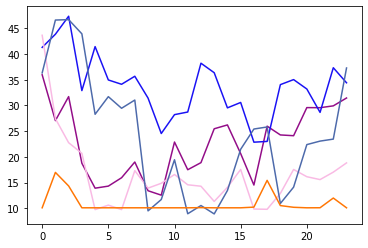

ROUND 23
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296180


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.196568
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.066615
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.684793
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.995248

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.310721
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.946888
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.655202
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.308553
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.499480

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.331376
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.049965
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.593610
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.054205
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.224864
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.917902
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.472504
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.799649

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.267321
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.112337
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.793574
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.518328
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.397168

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

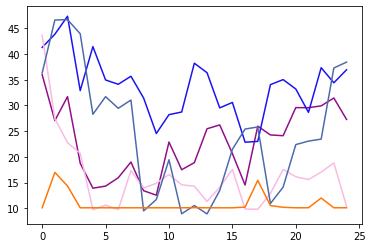

ROUND 24
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.320686


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.146467
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.035347
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.859636
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.090412

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.332720
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.041951
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.783523
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.593211
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.173293

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.313293
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.036049
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.606057
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.216958
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.234859
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.038771
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.344290
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.172858

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287883
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.136345
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.633225
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.390052
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.488837

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

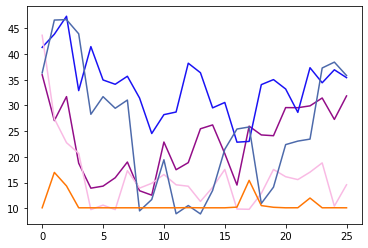

ROUND 25
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.278816


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.143134
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.080035
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.753523
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.230553

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296404
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.104146
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.782955
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.401897
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.515872

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306183
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.104303
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.806404
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.392689
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.199322
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.764919
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.606482
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.201937

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270456
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.047299
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.695505
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.553023
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.658513

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

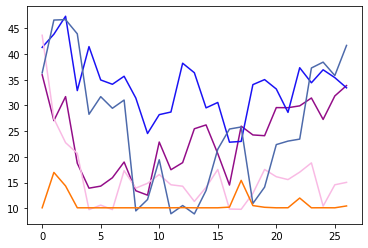

ROUND 26
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.305265


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.147928
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.922315
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.834665
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.872877

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.374841
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.959826
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.612363
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.767604
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.482996

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.345645
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.040679
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.721180
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.274833
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.174638
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.946033
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.490755
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.604085

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296247
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.101306
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.591007
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.728406
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.180092

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

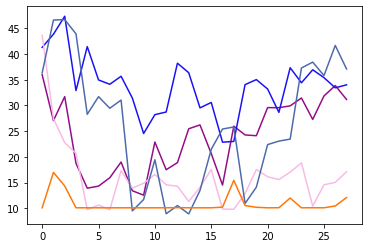

ROUND 27
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.250469


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.205193
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.875731
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.375858
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.475636

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.328921
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.012347
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.578685
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.131606
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.203954

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.369086
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.953817
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.350480
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.955762
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.203182
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.053581
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.749332
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.595916

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276533
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.013487
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.879887
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.563515
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.000883

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

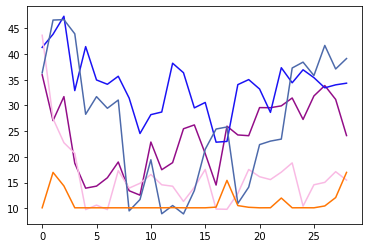

ROUND 28
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.273976


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.154029
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.826556
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.571373
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.584435

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.341067
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.961816
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.247207
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.273649
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.828384

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.336121
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.989599
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.505058
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.320708
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.191921
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.874045
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.242061
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.264859

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282832
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.094101
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.911915
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.536311
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.091660

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

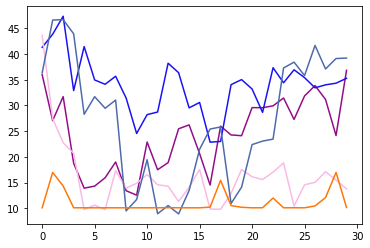

ROUND 29
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.244979


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.179664
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.985005
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.920620
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.569639

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.330966
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.027683
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.569881
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.536411
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.632790

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.340102
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.998552
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.456657
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.082202
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.167674
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.711090
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.550500
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.897643

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246828
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.090560
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.788374
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.342229
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.641802

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

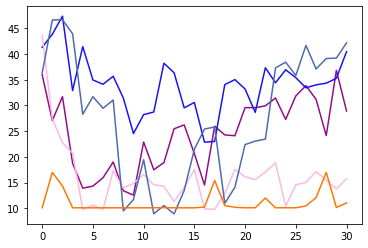

ROUND 30
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286595


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.166517
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.149406
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.848171
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.590574

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.361946
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.848565
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.436594
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.981491
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.816349

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.303727
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.044994
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.598707
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.166743
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.167951
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.660906
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.232056
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.736527

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.283866
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.173750
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.103156
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.766317
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.890814

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

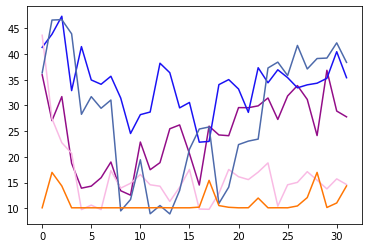

ROUND 31
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296238


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.140783
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.941882
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.668182
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.505855

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.316209
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.868304
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.129139
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.845624
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.108806

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292947
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.074515
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.501130
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.966803
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.121789
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.709870
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.578043
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.991575

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293110
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.085749
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.066108
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.649195
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.272703

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

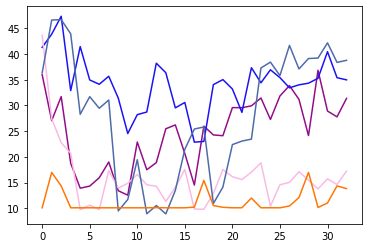

ROUND 32
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270088


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.084773
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.934544
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.620903
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.652575

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.318161
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.847895
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.498192
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.409835
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.043437

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301936
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.994662
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.330408
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.303662
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.166026
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.585102
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.238651
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.968494

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259148
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.117500
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.617427
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.308855
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.351700

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

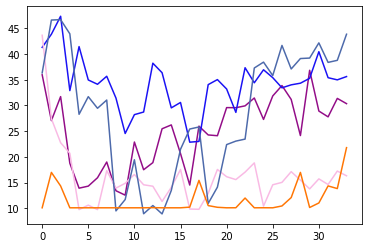

ROUND 33
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.297789


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.055659
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.933378
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.743314
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.599027

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.340656
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.947058
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.466788
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.530597
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.994673

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259623
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.062764
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.418613
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.053641
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.109586
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.731530
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.099226
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.499979

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.239714
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.060026
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.812371
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.640833
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.298039

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

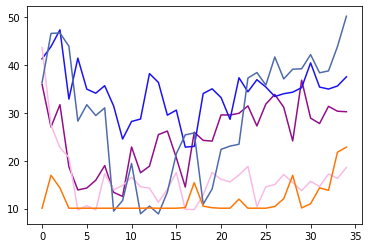

ROUND 34
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.307006


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.091896
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.636020
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.507684
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.294764

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.344482
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.823730
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.152823
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.103860
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.398346

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.351460
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.874043
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.152014
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.035544
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.100798
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.530148
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.039170
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.921820

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268512
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.998768
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.692055
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.743742
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.324270

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

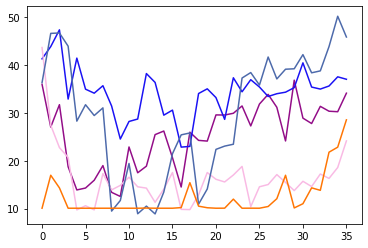

ROUND 35
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.273073


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.157434
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.851923
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.389129
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.942270

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.333812
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.793742
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.117977
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.165484
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.644831

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.375658
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.954614
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.211732
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.245210
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.107121
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.185829
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.095493
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.294211

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.232937
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.042136
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.915767
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.837410
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.382374

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

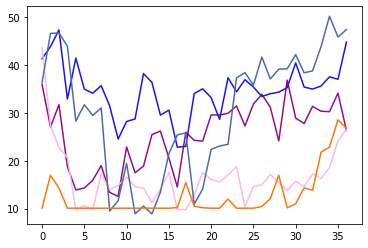

ROUND 36
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292175


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.071228
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.869398
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.729950
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.803383

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.322465
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.766029
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.402562
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.909232
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.192043

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290183
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.951737
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.204238
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.082327
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.091790
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.578542
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.314720
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.574806

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.300539
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.040133
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.689925
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.629394
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.795446

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

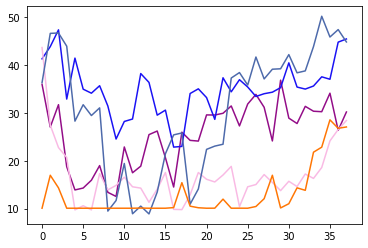

ROUND 37
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276490


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.077959
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.836307
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.331214
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.520975

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.368911
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.765314
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.129084
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.974515
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.996394

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.371952
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.860945
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.308947
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.714230
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.128124
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.608205
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.283347
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.008908

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268472
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.117979
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.751553
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.769274
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.440736

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

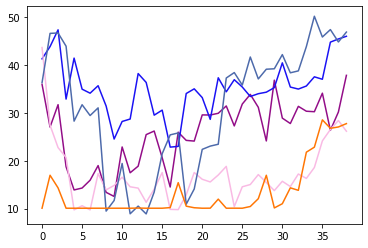

ROUND 38
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.271637


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.076913
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.638176
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.411785
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.949830

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.343611
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.713515
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.273317
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.204772
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.150197

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.417427
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.933872
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.229699
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.061350
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.037880
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.312368
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.959719
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.930521

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.214285
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.046281
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.613176
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.127315
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.289895

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

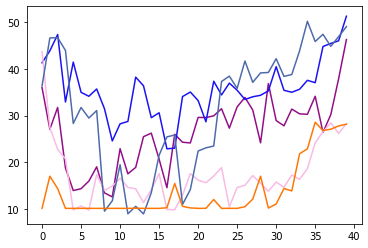

ROUND 39
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.278237


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.139167
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.739902
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.767761
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.831510

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.370169
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.811647
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.125768
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.904559
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.787345

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.404247
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.826871
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.109981
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.818337
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.006161
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.345475
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.842125
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.292168

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259552
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.100588
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.781866
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.225527
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.061660

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

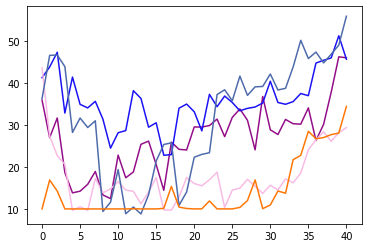

ROUND 40
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.255819


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.092079
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.674161
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.393341
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.070018

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.406181
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.727390
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.068994
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.914458
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.030872

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287110
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.939862
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.192832
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.693990
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.077438
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.492434
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.045084
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.202808

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.255759
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.931262
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.434796
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.017371
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.984234

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

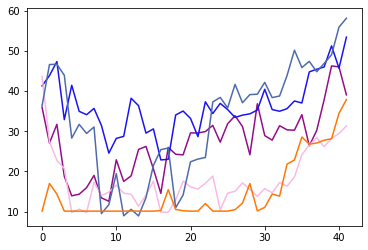

ROUND 41
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.280119


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.074403
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.549251
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.754919
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.525370

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.322623
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.924027
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.012733
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.633540
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.958055

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.011694
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.387117
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.830326
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.348775

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.280651
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.972182
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.477737
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.919203
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.727296

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

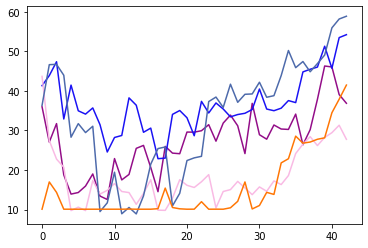

ROUND 42
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.252827


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.998845
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.730072
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.450144
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.757198

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.359035
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.725766
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.804074
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.933661
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.854896

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302172
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.780458
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.869864
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.692761
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.976483
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.230931
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.895384
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.838867

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.247097
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.934185
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.360304
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.970174
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.126368

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

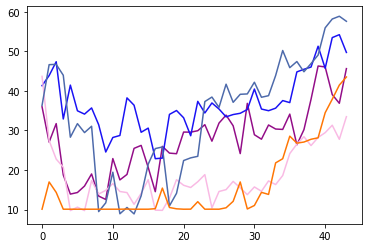

ROUND 43
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.315490


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.159519
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.947497
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.851663
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.145159

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.383127
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.457479
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.858878
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.066222
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.699683

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.394172
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.724983
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.284112
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.822016
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.957024
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.276487
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.120523
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.051367

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.268960
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.928369
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.452548
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.008289
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.213377

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

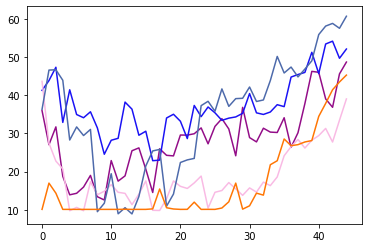

ROUND 44
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281499


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.918762
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.701943
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.330635
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.184975

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.367240
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.509803
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.554554
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.574800
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.900927

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.332036
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.761812
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.873298
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.965341
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.967146
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.391867
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.065323
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.302015

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291225
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.936742
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.301294
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.058409
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.302408

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

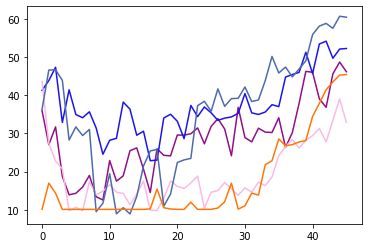

ROUND 45
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284116


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.095457
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.528291
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.321397
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.293213

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.343677
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.583480
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.039565
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.825878
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.382087

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282474
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.562935
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.031658
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.639214
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.966340
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.241722
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.767071
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.591233

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.275148
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.922757
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.378888
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.843341
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.115275

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

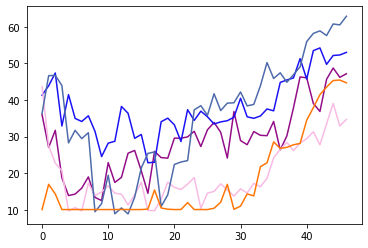

ROUND 46
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.272584


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.971964
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.393575
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.477674
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.277695

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.355083
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.343472
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.915263
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.682909
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.691673

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.372228
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.607867
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.861436
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.171650
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.889113
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.830637
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.971245
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.839640

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.220389
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.855848
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.427959
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.137037
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.743273

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

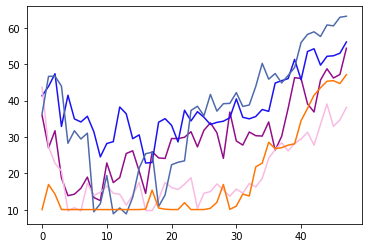

ROUND 47
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.258013


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.085641
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.515231
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.404283
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.289058

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.330653
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.682087
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.949420
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.875930
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.638530

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.791976
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.216092
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.032281
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.233652

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.229846
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.849059
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.100279
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.017812
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.913864

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

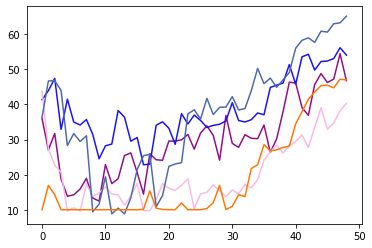

ROUND 48
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281385


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 2.012378
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.570946
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.391583
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.490944

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.390969
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.587654
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.123801
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.745140
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.798374

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.374179
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.622560
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.851551
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.941865
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.775277
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.994392
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.816725
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.059383

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.238700
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.857351
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.271406
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.006993
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.907685

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

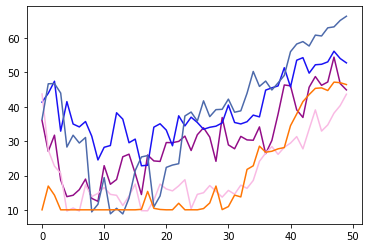

ROUND 49
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.227474


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.899554
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.660461
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.356851
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.103094

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.381223
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.527989
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.103371
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.865308
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.287138

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.368913
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.720147
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.633091
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.516759
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.681284
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.972938
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.954967
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.224665

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.202806
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.793094
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.164570
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.079116
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.792587

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

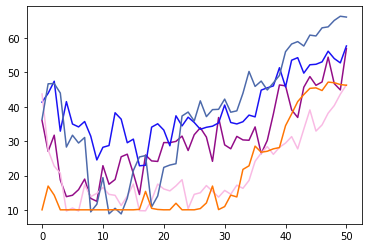

ROUND 50
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.285842


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.910063
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.668331
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.433383
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.400092

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.362960
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.467588
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.195734
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.831720
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.042517

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.353177
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.591824
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.616095
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.594275
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.778727
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.018191
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.118098
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.902970

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286641
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.809028
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.165542
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.955046
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.192441

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

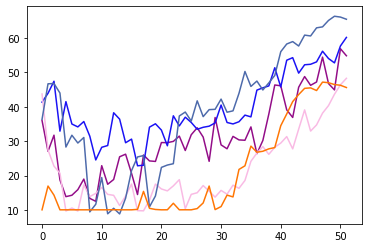

ROUND 51
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277289


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.918150
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.367195
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.344745
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.525012

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.325006
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.608531
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.806184
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.718742
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.946233

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277913
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.415074
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.990726
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.352696
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.751117
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.029520
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.808499
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.083715

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.238407
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.722894
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.928455
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.559717
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.364977

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

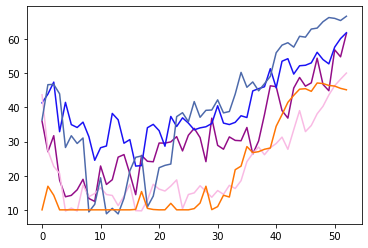

ROUND 52
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246608


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.959787
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.221844
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.837714
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.344788

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.401502
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.628531
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.824270
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.049538
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.191951

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.366782
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.293249
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.771495
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.989043
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.717644
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.940084
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.883580
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.832532

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215422
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.688653
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.018714
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.865025
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.761172

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

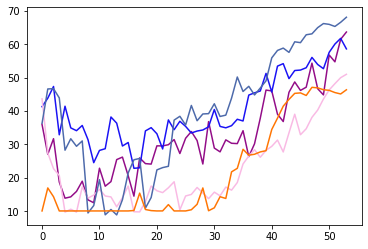

ROUND 53
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.362742


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.875405
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.383979
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.114264
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.357519

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.362072
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.424946
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.114805
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.161238
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.989441

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.326145
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.448880
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.679617
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.689135
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.627840
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.749039
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.659132
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.131420

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.245083
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.568614
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.886718
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.697290
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.935411

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

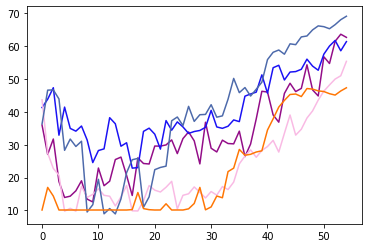

ROUND 54
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.239357


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.766000
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.293717
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.248342
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.040708

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.361711
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.324191
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.914064
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.718007
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.340764

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.321276
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.520998
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.773611
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.991008
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.660218
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.072595
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.697354
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.363675

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.209637
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.609082
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.859448
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.596218
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.651453

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

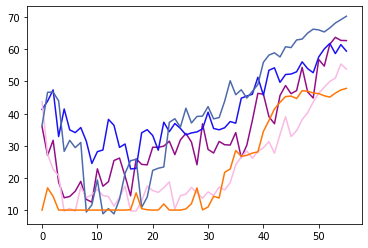

ROUND 55
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.257454


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.887862
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.305196
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.361899
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.267793

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.291415
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.346845
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.691621
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.989394
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.576794

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.330021
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.334338
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.651978
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.622344
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.605131
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.921859
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.182040
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.374708

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215933
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.587685
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.667328
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.666399
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.452258

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

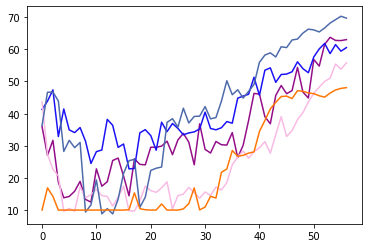

ROUND 56
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277066


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.781898
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.064079
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.870659
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.624976

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.317038
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.412151
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.857385
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.582525
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.924117

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.328070
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.369063
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.726185
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.459570
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.747334
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.257121
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.760204
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.024984

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.208511
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.526658
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.887316
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.816860
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.822655

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

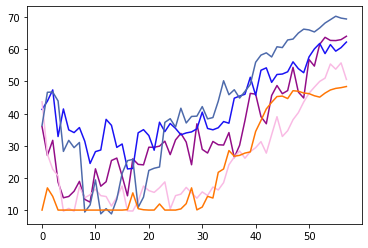

ROUND 57
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.271205


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.917881
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.484887
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.707147
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.440421

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.319758
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.339705
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.751991
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.642859
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.928004

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.312690
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.286724
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.407181
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.463197
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.475262
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.519581
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.954854
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.150691

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259247
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.557483
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.501453
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.898856
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.125919

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

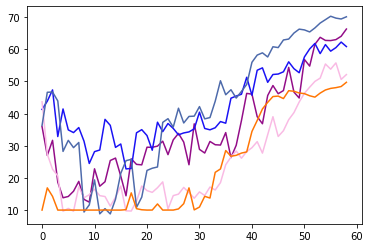

ROUND 58
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290022


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.663119
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.048903
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.089502
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.792909

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.412889
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.392897
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.150400
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.703781
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.381356

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.316720
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.170901
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.319301
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.657999
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.381807
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.004753
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.545434
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.640810

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.206246
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.604436
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.877333
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.860818
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.171367

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

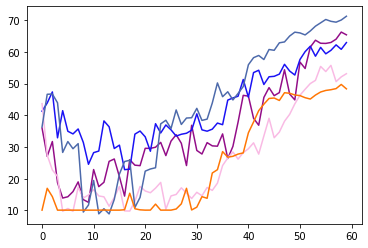

ROUND 59
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.229622


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.744324
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.383562
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.338109
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.572528

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.406161
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.341419
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.783171
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.829352
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.817411

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.363670
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.105689
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.880075
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.540905
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.663645
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.117620
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.691738
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.697012

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.238916
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.410351
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.582105
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.594603
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.823872

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

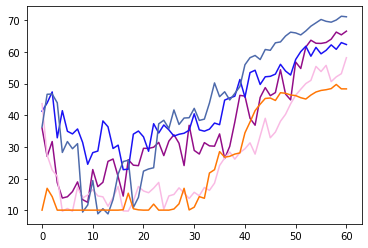

ROUND 60
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.242644


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.641208
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.024437
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.546627
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.419443

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.347554
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.360018
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.839457
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.194283
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.392083

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.327986
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.141547
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.536901
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.714619
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.447808
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.892410
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.106097
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.203804

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.182809
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.361303
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.559602
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.034295
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.622002

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

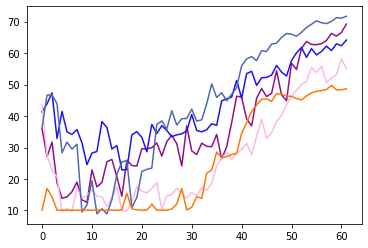

ROUND 61
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.234123


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.729415
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.271388
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.922421
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.079274

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.361632
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.302406
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.569397
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.833348
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.071020

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.357985
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.079850
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.547897
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.719258
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.516462
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.918889
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.600293
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.872602

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.248277
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.344053
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.600589
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.807362
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.211925

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

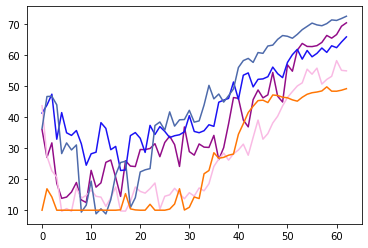

ROUND 62
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.249432


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.603292
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.931231
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.238789
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.596438

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.253422
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.216959
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.162894
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.661640
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.968453

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.365581
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.902208
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.608611
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.637747
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.541451
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.700230
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.807412
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.662583

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.181131
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.407565
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.583529
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.611556
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.137376

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

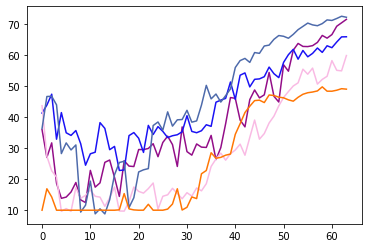

ROUND 63
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.277431


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.844527
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.112894
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.532384
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.460763

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.342096
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.302633
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.741685
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.186816
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.875982

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.368940
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.118787
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.542686
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.247621
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.502256
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.262096
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.542856
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.786318

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.265355
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.378634
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.702415
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.641402
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.692451

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

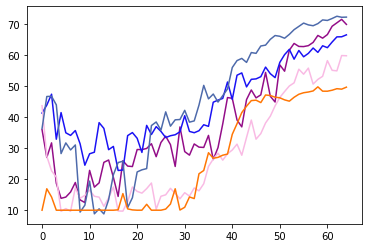

ROUND 64
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.266180


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.676499
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.224231
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.181103
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.332331

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294652
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.486224
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.922113
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.156229
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.502630

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.254812
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.935860
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.401143
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.319709
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.364475
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.969987
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.684702
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.659632

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.214120
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.261553
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.623475
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.406947
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.219526

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

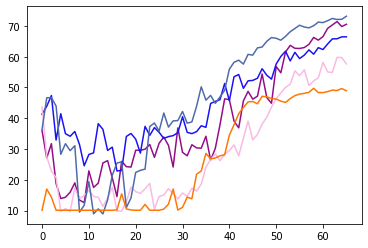

ROUND 65
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.269649


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.669614
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.043048
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.056623
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.349362

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.443260
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.134485
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.868782
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.821973
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.293835

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.407986
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.883103
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.728673
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.389686
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.267012
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.947659
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.711017
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.168709

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.202524
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.219642
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.655215
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.865821
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.594904

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

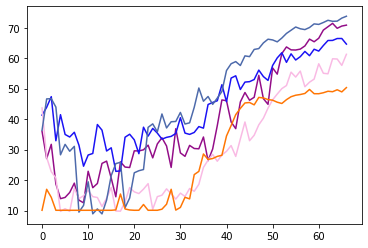

ROUND 66
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.312492


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.607947
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.808167
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.770994
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.561637

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.367954
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.189698
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.669695
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.264696
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.512050

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.301350
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.948114
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.528164
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.365987
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.249758
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.882064
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.277904
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.696377

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.179260
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.315240
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.667546
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.520504
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.663378

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

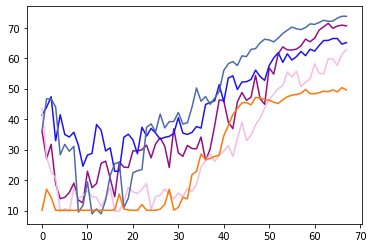

ROUND 67
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.275988


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.432070
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.106367
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.780363
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.885876

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.310449
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.232034
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.768557
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.797978
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.069251

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.281900
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.000851
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.354667
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.913338
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.291702
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.944888
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.425019
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.981223

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.223483
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.218524
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.615384
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.838230
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.169856

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

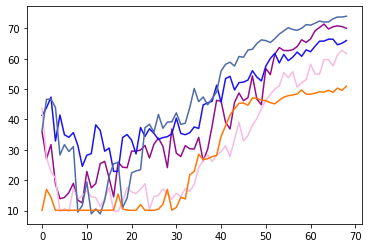

ROUND 68
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.353626


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.638570
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.798005
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.758782
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.418006

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.361098
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.376014
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.895808
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.881126
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.341748

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306913
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.014298
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.645285
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.760136
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.475583
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.626652
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.687216
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.730252

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.178418
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.305651
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.493738
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.711246
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.819253

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

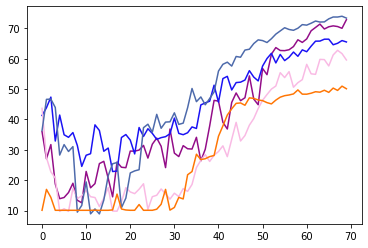

ROUND 69
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.241593


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.404202
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.101873
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.844613
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.850811

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.288093
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.071301
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.690524
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.902893
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.542738

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290219
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.045190
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.667613
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.712162
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.253375
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.507549
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.837807
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.677060

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.159360
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.187486
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.662337
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.886658
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.201244

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

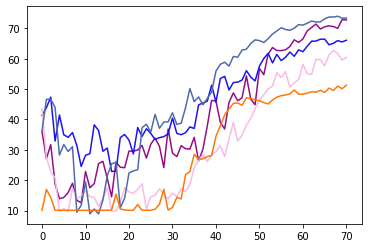

ROUND 70
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246249


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.593141
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.902992
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.710574
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.814951

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.272843
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.303955
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.611040
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.801875
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.610347

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.438992
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.201929
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.839084
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.046654
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.275474
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.617131
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.628052
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.762049

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.206397
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.193790
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.441455
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.590045
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.819198

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

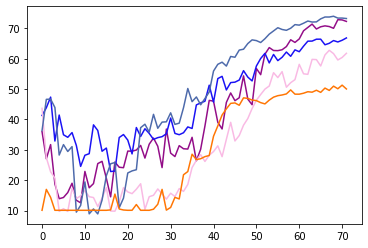

ROUND 71
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.274714


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.451450
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.786231
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.960919
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.489069

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.263592
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.097261
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.658282
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.293439
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.101451

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.266699
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.825761
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.402617
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.477759
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.199623
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.566076
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.884492
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.649981

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.207449
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.155963
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.720127
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.840164
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.853593

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

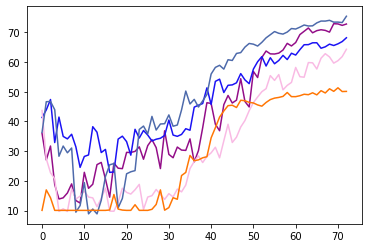

ROUND 72
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.255521


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.348539
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.762743
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.526724
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.561930

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.348311
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.077202
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.841394
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.001882
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.482949

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.372183
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.108458
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.836236
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.319704
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.268777
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.894927
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.703202
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.127676

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.186184
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.272262
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.566371
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.598015
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.888670

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

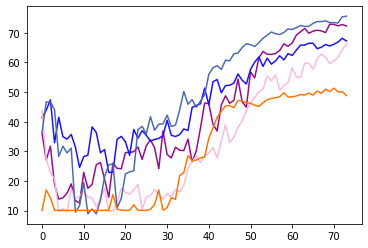

ROUND 73
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.229953


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.573264
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.963010
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.858067
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.150222

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.395128
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.013590
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.596037
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.972327
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.831482

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.293097
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.922660
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.223428
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.286899
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.147395
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.624318
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.906932
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.679040

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.230334
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.132889
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.423096
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.375049
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.370015

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

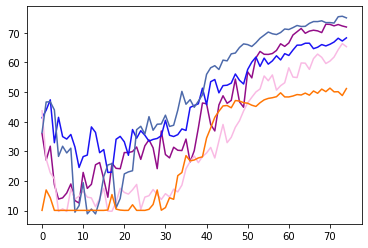

ROUND 74
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.212636


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.337829
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.719764
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.831634
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.643528

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.307365
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.058858
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.577786
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.006243
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.375124

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.274259
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.888116
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.439593
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.307465
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.080556
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.474734
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.449280
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.710280

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.196153
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.922841
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.615128
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.547954
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.854124

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

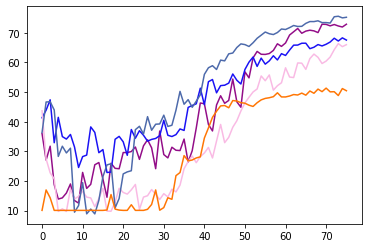

ROUND 75
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.257374


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.280885
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.837922
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.535671
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.324488

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.294452
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.166273
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.819405
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.799511
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.987143

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.296333
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.920194
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.347791
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.665765
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.063893
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.518875
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.827897
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.653067

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.152142
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.989536
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.577891
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.441223
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.016485

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

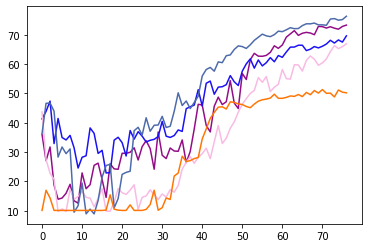

ROUND 76
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.211653


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.396873
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.912259
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.853439
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.694091

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.429534
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.042006
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.810092
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.910477
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.990306

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279970
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.951020
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.575611
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.474930
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.063601
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.440362
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.750020
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.378052

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.206511
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.903523
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.431621
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.841449
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.926505

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

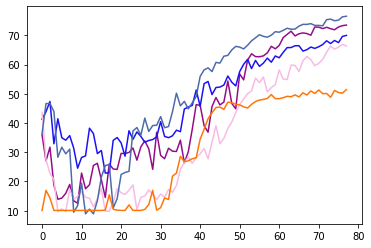

ROUND 77
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.244566


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.191492
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.739527
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.719330
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.212064

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298399
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.184932
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.943303
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.213482
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.969432

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.319873
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.945135
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.693587
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.953979
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.113772
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.442171
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.559736
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.305491

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.186503
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.992992
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.338358
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.557449
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.700701

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

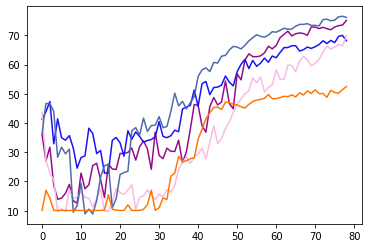

ROUND 78
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.237880


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.344522
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.009227
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.523197
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.090849

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.299047
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.068820
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.835191
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.783118
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.694722

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.274145
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.604704
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.459065
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.596182
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.989554
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.752029
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.807842
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.959590

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.180506
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.730423
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.312340
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.663135
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.847648

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

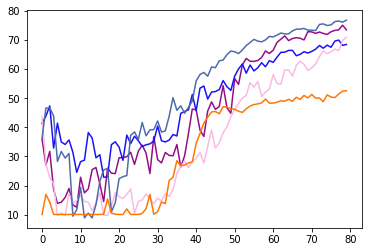

ROUND 79
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.170601


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.267491
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.087251
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.014228
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.909459

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276121
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.109134
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.723813
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.947401
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.567134

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282741
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.615135
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.388386
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.683493
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.103046
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.637463
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.420470
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.461436

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.155635
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.987089
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.626016
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.956321
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.837812

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

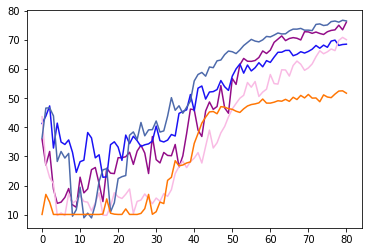

ROUND 80
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.226148


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.363621
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.608995
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.682489
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.254295

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.339258
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.779634
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.624261
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.338251
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.003162

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.242199
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.686857
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.288223
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.657147
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.055897
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.654022
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.993372
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.319286

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.223295
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.788893
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.508993
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.539895
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.987610

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

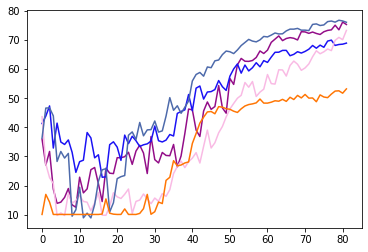

ROUND 81
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.321966


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.186616
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.688884
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.546502
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.630435

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.324818
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.882000
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.050352
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.593406
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.541842

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.355972
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.700628
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.955057
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.657724
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.011384
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.761840
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.490142
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.767689

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.095717
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.768604
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.218407
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.000607
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.355761

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

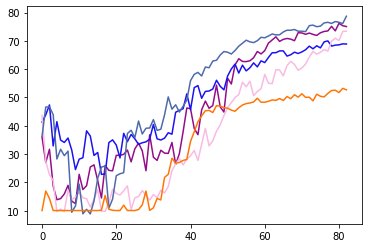

ROUND 82
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.232690


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.207890
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.647504
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.912791
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.181526

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.330743
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.092894
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.533211
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.733249
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.041020

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.350687
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.662291
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.197097
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.454212
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.118535
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.215905
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.506143
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.118039

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.156675
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.779048
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.652179
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.698424
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.229550

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

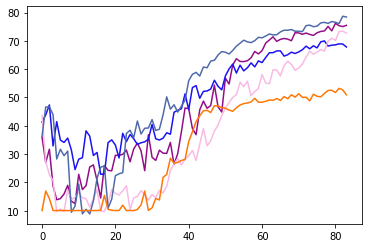

ROUND 83
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.226003


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.356543
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.770162
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.785070
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.088259

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.390533
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.009820
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.978941
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.642590
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.950051

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.335848
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.818151
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.401533
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.579182
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.995638
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.939730
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.643899
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.273601

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.213929
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.546523
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.492511
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.377220
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.302667

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

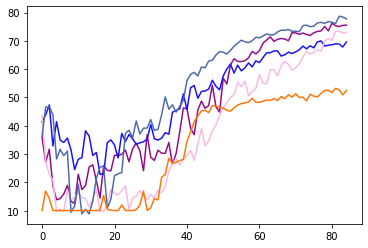

ROUND 84
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.198238


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.280623
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.705824
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.695127
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.840401

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.361169
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.052369
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.643539
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.629952
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.559598

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276483
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.851254
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.620899
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.487056
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.875546
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.711295
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.749814
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.625174

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.169428
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.894001
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.463062
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.061755
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.785561

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

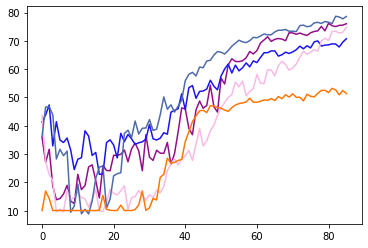

ROUND 85
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.158657


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.182473
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.810149
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.787597
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.773659

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.278698
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.689025
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.600119
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.384777
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.608317

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.315335
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.787426
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.401698
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.600258
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.755775
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.672936
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.485579
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.925241

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.072365
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.770055
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.378950
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.290961
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.435166

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

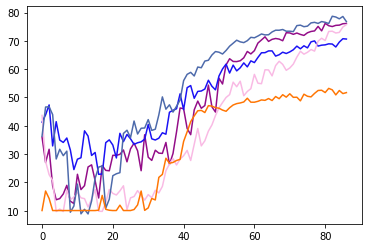

ROUND 86
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.249760


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.282512
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.488667
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.387836
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.532986

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.349721
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.025655
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.824717
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.744224
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.687090

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.355302
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628937
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.250326
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.421044
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.818722
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.481079
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.498012
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.691176

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.128666
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.001234
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.691121
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.784983
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.867368

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

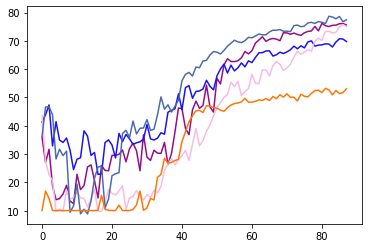

ROUND 87
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.175228


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.135557
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.806427
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.933415
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.768926

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298386
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.067430
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.709809
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.689679
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.918202

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.271623
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.826444
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.679998
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.630909
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.884422
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.604605
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.666596
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.764135

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.125564
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.690295
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.713866
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.243569
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.593592

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

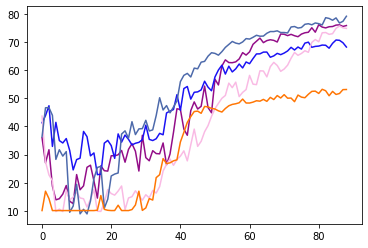

ROUND 88
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.276970


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.425033
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.952131
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.000518
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.149707

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.355489
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.909801
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.976124
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.816498
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.008830

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.181006
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.663682
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.530768
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.317337
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.069005
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.778002
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.146965
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.189175

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.161151
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.890931
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.735675
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.480770
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.852419

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

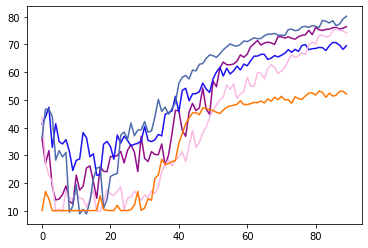

ROUND 89
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.134957


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.142757
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.184087
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.425292
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.757218

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.333916
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.882842
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.458411
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.657588
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.034797

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.214790
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.749080
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.456918
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.385317
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.002801
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.667682
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.747374
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.824261

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.100390
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.821612
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.499490
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.865874
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.389611

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

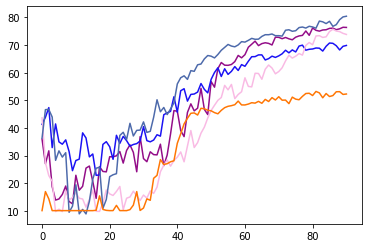

ROUND 90
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.178749


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.200724
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.097703
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.327843
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.326629

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.290083
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.162685
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.749744
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.699765
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.366004

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.237586
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.804281
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.630065
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.566247
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.707008
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.439330
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.600536
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.690326

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.211596
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.925103
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.540593
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.648901
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.619253

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

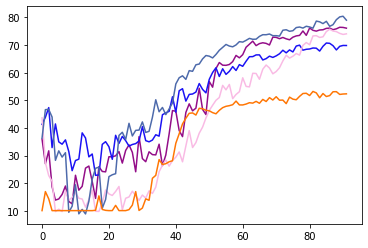

ROUND 91
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.221835


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.265405
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.775867
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.852641
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.217115

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.308222
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.820425
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.537956
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.136762
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.757092

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.271286
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.837965
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.435803
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.291777
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.738386
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.589434
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.157467
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.988973

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.053423
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.770675
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.847581
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.490696
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.366775

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

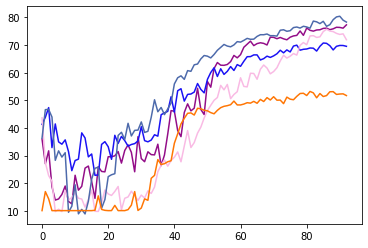

ROUND 92
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279230


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.172511
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.905255
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.937819
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.186046

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282596
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.767916
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.629527
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.099236
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.595061

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.246056
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.801109
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.569969
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.062979
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.758697
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.330417
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.467110
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.235241

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.068711
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.799888
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.364146
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.684509
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.527355

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

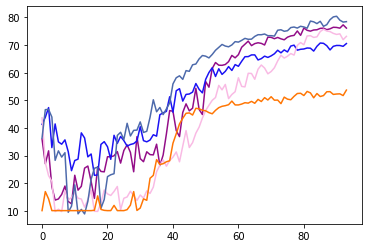

ROUND 93
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.238043


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.162118
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.824379
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.395744
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.681138

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306088
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.934737
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.938393
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.701875
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.327916

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.231320
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.789479
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.409831
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.695764
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.916840
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.601515
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.960950
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.780667

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.157425
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.862283
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.784340
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.775190
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.551469

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

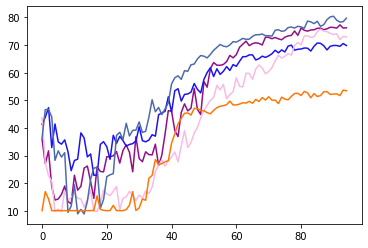

ROUND 94
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.164325


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.867107
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.834510
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.881744
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.182511

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.168300
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.012956
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.534919
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.878208
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.205210

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.286292
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.706277
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.343510
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.637384
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.950384
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.730170
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.382798
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.151123

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.180863
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.656285
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.463782
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.629651
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.592982

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

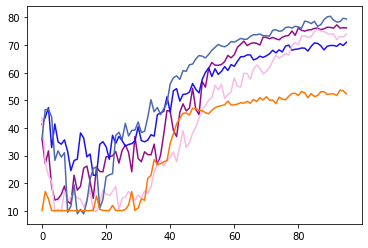

ROUND 95
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.243036


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.029859
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.833251
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.140211
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.918774

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.159033
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.825775
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.803370
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.908550
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.801348

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.135559
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.633436
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.367123
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.408664
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.763453
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.562264
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.761189
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.842137

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.151815
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.797384
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.458546
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.576211
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.699377

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

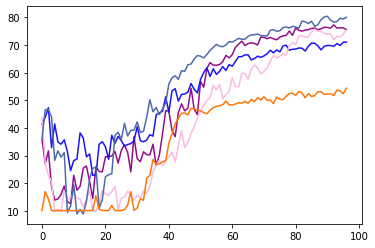

ROUND 96
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.247768


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.159033
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.641364
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.482797
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.832527

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.331439
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.523556
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.704585
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.029888
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.147893

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.302836
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.735839
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.253706
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.308697
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.686779
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.375121
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.506035
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.719820

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.159741
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.799440
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.947044
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.888530
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.884613

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

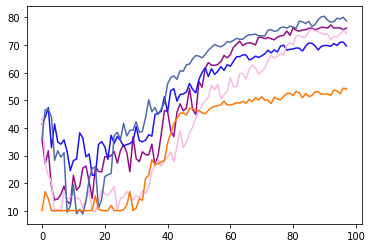

ROUND 97
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.114121


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.872813
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.549483
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.653718
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.719742

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279124
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.674329
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.386774
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.950572
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.016538

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.427572
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.732575
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.325253
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.766926
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.933997
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.834112
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.069734
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 6.595069

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.135509
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.747482
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.360712
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.393047
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.645070

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

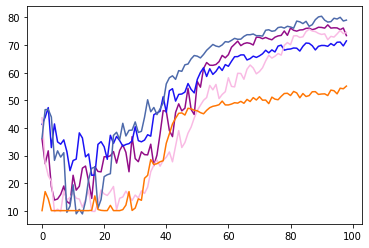

ROUND 98
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215953


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.792105
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.495620
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.424626
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.238307

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.287280
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.752681
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.826729
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.769915
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.281982

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.264450
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.838765
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.018281
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.454395
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.885333
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.924976
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.090810
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.782732

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.099156
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.528191
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.658980
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.855487
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.414802

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

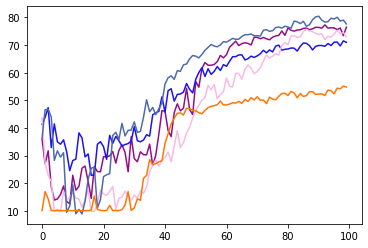

ROUND 99
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.135594


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.896037
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.702212
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.524453
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.795297

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.284158
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.671804
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.800848
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.113687
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.311502

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.188399
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.745175
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.380156
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.809611
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.996409
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.694944
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.896467
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.945230

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.106926
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.722339
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.614404
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.861245
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.666008

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

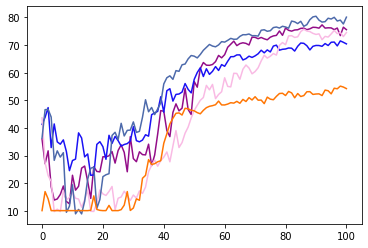

ROUND 100
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.239906


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.951191
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.541501
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.813526
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.270752

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.385813
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.898312
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.605096
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.778290
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.532582

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.349437
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.540924
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.609003
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.769673
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.747841
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.866629
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.844347
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.740666

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.070470
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.730504
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.726184
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.317730
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.518358

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

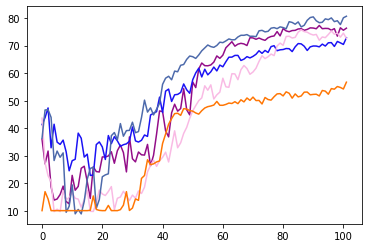

ROUND 101
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.120983


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.927242
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.592125
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.282505
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.768966

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.340374
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.843842
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.856490
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.963028
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.193275

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298134
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.637848
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.252056
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.889026
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.976086
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.941406
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.406316
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.686135

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.055489
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.839044
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.601363
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.561379
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.470133

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

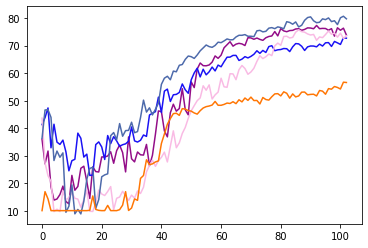

ROUND 102
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.205982


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.880279
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.692504
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.812920
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.959422

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.327501
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.697336
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.590061
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.223631
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.358994

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.216215
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.657821
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.891658
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.960240
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.804254
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.517549
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.615506
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.244722

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.118829
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.677692
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.540382
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.365098
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.107373

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

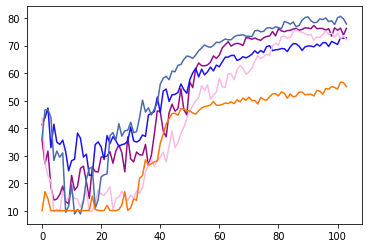

ROUND 103
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.117565


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.999945
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.643226
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.879019
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.776344

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.315525
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.911972
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.663864
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.696436
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.477699

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.132875
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.576943
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.404195
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.599081
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.608623
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.476739
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.816607
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.701955

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.108983
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.793270
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.606765
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.543280
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.576513

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

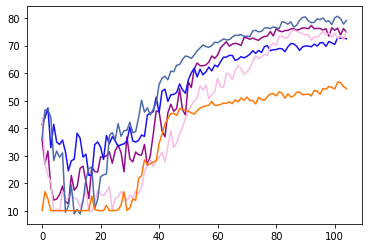

ROUND 104
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.117574


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.833813
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.390623
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.949351
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.398674

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.263286
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.031100
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.536476
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.293806
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.552072

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.201552
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.584264
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.358443
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.873655
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.531614
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.919272
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.169126
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.829993

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.164530
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.695700
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.712571
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.937841
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.950227

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

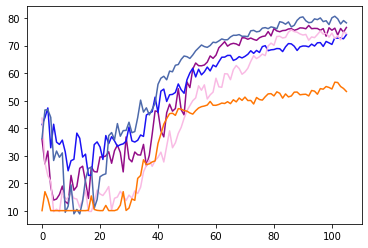

ROUND 105
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.117709


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.947008
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.690119
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.803704
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.858094

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.298354
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.848011
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.409502
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.453577
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.744995

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.249464
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.641883
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.280360
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.341161
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.817367
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.725183
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.026792
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.447523

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.051257
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.645220
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.451579
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.732796
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.877430

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

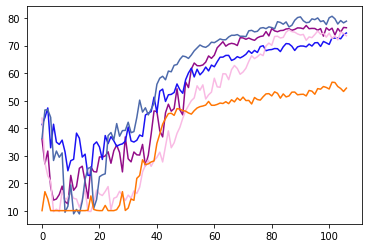

ROUND 106
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.218053


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.884797
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.292152
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.049757
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.472671

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.185752
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.747195
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.390106
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.770570
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.491355

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.261669
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.575620
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.315126
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.116945
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.965278
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.643299
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.445119
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.085325

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.066313
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.621373
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.712733
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.924816
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.303805

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

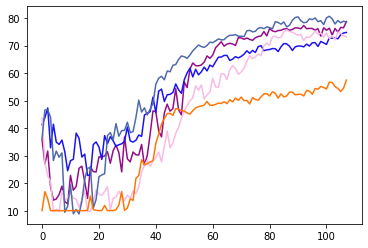

ROUND 107
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.131793


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.836849
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.826967
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.478180
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.517175

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.339812
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.987447
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.037453
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.946589
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.503762

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.135597
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.466876
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.365752
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.444292
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.832207
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.879715
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.361184
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.815473

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.044618
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.685750
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.680429
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.538979
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.713206

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

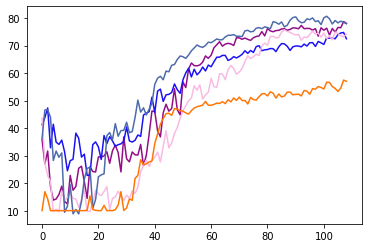

ROUND 108
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.132109


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.875621
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.516923
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.545990
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.791896

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.218339
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.618122
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.662880
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.420278
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.740645

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.200325
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.449210
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.946253
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.499037
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.905547
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.032508
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.365730
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.103265

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.119162
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.834296
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.615239
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.141344
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.511332

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

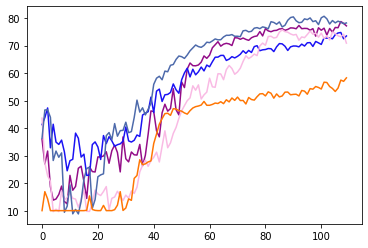

ROUND 109
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.054211


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.821038
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.639728
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.440415
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.900864

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.292710
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.916255
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.540880
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.190496
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.413130

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.163197
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.537413
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.584100
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.892996
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.932062
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.879655
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.881194
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.396056

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.021064
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.489138
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.588474
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.885717
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.683986

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

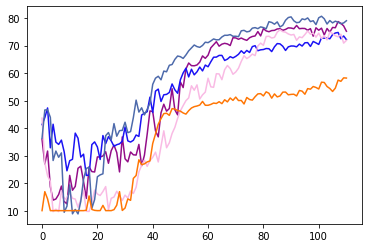

ROUND 110
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.121226


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.985189
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.323653
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.159340
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.551463

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.270175
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.697743
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.703893
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.406344
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.212290

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.283022
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.551237
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.467937
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.732139
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.139670
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.425970
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.996286
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.764563

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.074769
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.825469
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.519186
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.741865
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.913402

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

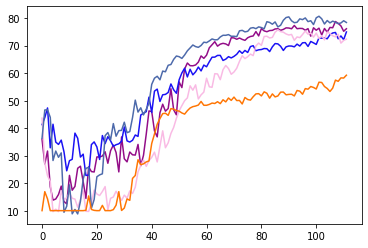

ROUND 111
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.071163


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.870592
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.438202
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.318837
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.976306

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.327064
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.564271
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.680746
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.451379
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.007458

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.348785
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.809380
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.954855
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.502340
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.835271
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.083927
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.981533
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.855649

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.011760
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.677753
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.117793
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.528693
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.398989

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

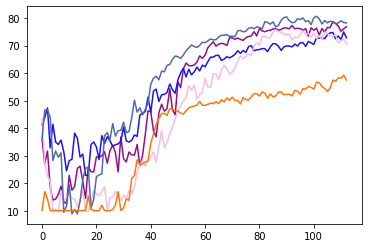

ROUND 112
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.179296


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.772159
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.322252
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.299976
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.630393

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.198387
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.572025
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.587353
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.477695
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.818801

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.135032
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.800998
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.596806
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.715487
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.646841
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.789877
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.868784
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.803827

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.057164
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.674621
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.278024
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.163376
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.475815

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

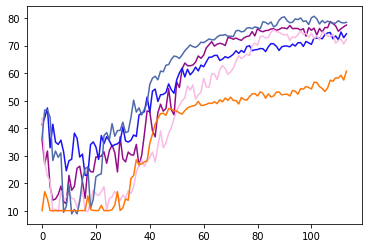

ROUND 113
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.105333


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.674403
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.296294
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.387735
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.698949

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.279397
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.640276
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.319580
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.029073
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.596335

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.213245
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.620538
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.415469
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.467092
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.031630
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.791163
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.725999
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.637715

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.093888
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.599146
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.911807
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.914887
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.731805

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

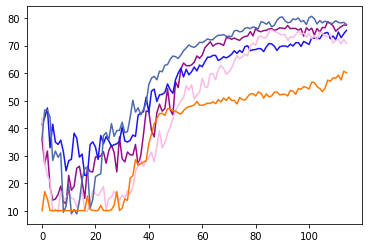

ROUND 114
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.153325


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.744556
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.375917
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.455763
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.521251

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.226938
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.771640
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.759917
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.893793
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.889803

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.243044
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.562065
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.401877
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.976131
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.000013
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.669575
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.012187
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.251411

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.027305
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.708299
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.637630
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.035246
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.843040

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

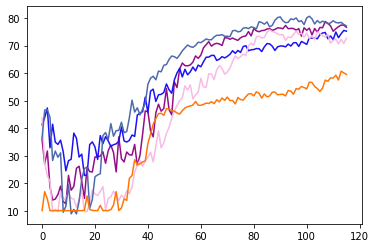

ROUND 115
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.163164


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.666062
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.558924
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.499488
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.075308

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.224041
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.653486
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.462822
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.488294
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.621582

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.117683
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.771905
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.687485
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.597295
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.844779
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.336956
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.712526
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.678392

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.126075
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.635661
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.513099
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.583217
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.535738

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

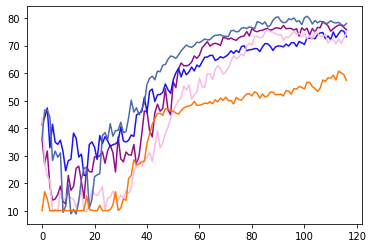

ROUND 116
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.006390


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.740337
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.492266
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.718923
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.889920

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.351736
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.933327
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.644190
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.677409
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 7.371370

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.126288
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.885503
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.442214
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.325119
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.961561
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.936224
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.148743
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.143339

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.181572
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.565242
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.408890
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.519068
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.737804

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

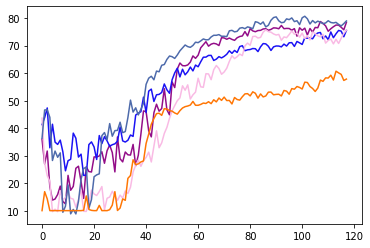

ROUND 117
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.127429


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.679634
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.331053
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.937146
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.950836

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.149832
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.797963
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.782555
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.491372
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.700779

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.199004
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.661285
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.769388
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.482673
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.479298
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.273345
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.193132
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.582413

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.935320
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.647985
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.511118
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.897862
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.808819

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

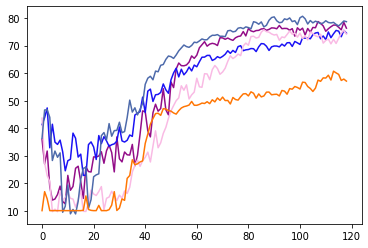

ROUND 118
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.051057


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.914364
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.362349
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.276049
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.507800

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.191544
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.787578
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.137949
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.558008
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.678496

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.837242
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.691292
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.847529
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.062583

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.983914
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.794856
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.633089
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.330340
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.400879

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

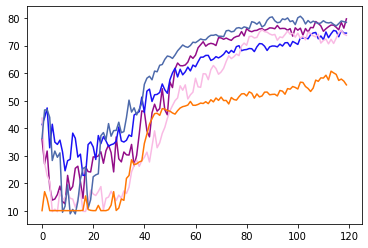

ROUND 119
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.028299


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.662396
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.521947
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.418841
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.852553

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.113250
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.832618
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.485234
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.669986
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.845526

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.191716
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.420271
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.482671
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.267316
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.683167
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.887161
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.050305
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.147894

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.017323
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.634318
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.579231
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.514774
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.971304

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

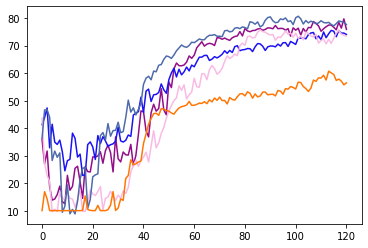

ROUND 120
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.055090


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.593144
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.711743
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.384658
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.397066

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.266449
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.709202
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.798150
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.598285
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.132031

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.188422
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.931891
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.645285
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.858646
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.941826
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.588358
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.231016
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.064309

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.919544
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.736444
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.526423
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.959356
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.220529

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

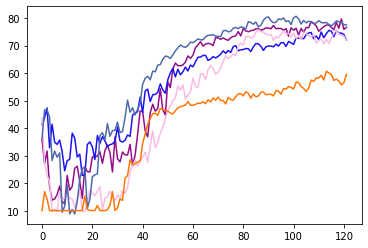

ROUND 121
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.115729


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.866652
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.993320
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.494568
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.191975

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.125156
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.688722
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.674042
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.737054
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 5.490661

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.072413
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.832325
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.947459
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.349236
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.823580
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.121270
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.204027
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.910468

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.978228
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.608043
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.698973
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.741713
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.868242

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

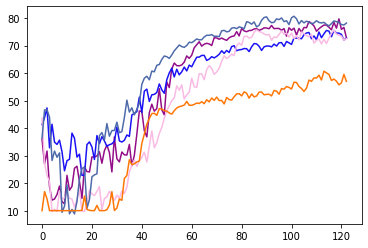

ROUND 122
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.089810


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.817904
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.563332
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.774386
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.490027

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.186204
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.639814
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.728848
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.587644
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.291897

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.218160
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.735397
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.434456
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.748327
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.911335
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.804843
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.973495
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.202459

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.052912
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.767343
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.947441
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.717220
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.940363

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

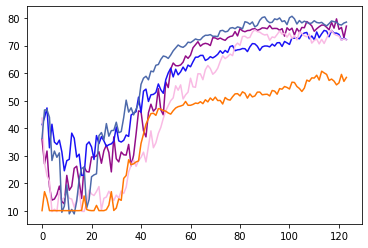

ROUND 123
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.099094


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.910419
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.522093
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.947204
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.323228

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.405492
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.663208
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.723207
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.564880
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.172038

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.052776
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.529583
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.402228
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.586229
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.103343
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.756996
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.362174
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.599898

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.137134
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.596926
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.599088
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.216263
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.976656

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

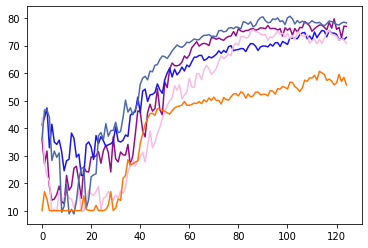

ROUND 124
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.076298


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.593417
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.812494
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.427754
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.211230

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.130995
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.761955
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.697524
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.529163
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.940734

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259898
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.532579
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.825463
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.493327
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.799775
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.543022
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.880586
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.242303

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.112640
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.821846
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.428206
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.710726
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.573581

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

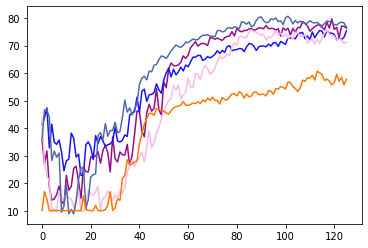

ROUND 125
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.062302


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.603658
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.434950
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.900990
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.163486

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.245080
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.758434
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.845334
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.545424
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.474586

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.225852
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.475295
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.549082
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.300447
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.777870
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.409491
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.294963
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.940924

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.998682
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.663173
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.388125
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.670330
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.197389

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

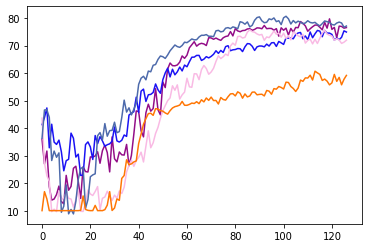

ROUND 126
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.060790


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.748642
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.352922
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.752117
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.616288

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.207629
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.639661
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.487736
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.568167
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.593671

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.876746
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.145996
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.088995
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.505133

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.014799
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.716829
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.566789
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.092423
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.312101

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

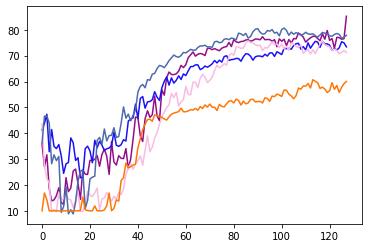

ROUND 127
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.037937


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.582044
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.554328
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.813933
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.979278

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.195037
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.493189
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.587686
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.837909
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.290524

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215954
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.380653
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.275704
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.769931
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.766727
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.970351
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.821915
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.913957

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.117997
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.717371
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.559094
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.260585
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.940059

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

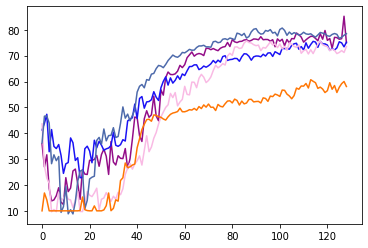

ROUND 128
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.183301


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.767177
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.641283
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.819657
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.932837

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282334
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.543083
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.454230
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.848502
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.575834

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.177380
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.644920
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.892690
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.445917
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.726858
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.364900
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.081627
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.234173

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.984307
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.549479
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.447873
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.449582
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.310427

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

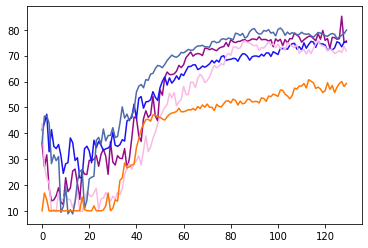

ROUND 129
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.175990


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.673477
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.220494
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.220179
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.226768

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.269607
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.665646
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.450522
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.613447
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.778428

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.059792
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.767233
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.613185
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.845089
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.688912
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.420522
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.461212
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.884218

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.993776
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.677165
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.430192
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.839708
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.098585

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

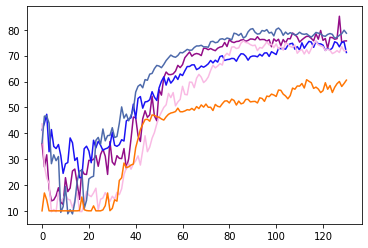

ROUND 130
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.031736


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.902629
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.766716
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.968713
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.811157

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.161046
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.416423
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.586565
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.841891
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.626810

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.189860
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.514466
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.804740
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.450455
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.633596
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.799531
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.171529
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.851927

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.048725
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.821236
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.899478
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.151117
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.470405

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

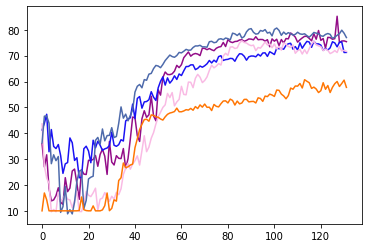

ROUND 131
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.045580


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.732672
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.445466
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.386474
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.633609

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.269776
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.696897
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.674462
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.727310
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.495716

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.183294
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.675562
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.538039
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.643557
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.630158
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.487814
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.785892
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.172195

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.083122
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.725374
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.880586
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.231550
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.980216

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

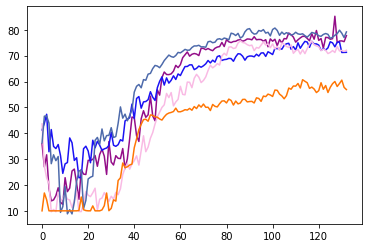

ROUND 132
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.987390


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.752222
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.820900
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.550560
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.259952

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.106359
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.711890
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.510752
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.051900
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.648332

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.729946
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.726972
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.973725
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.916078

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.935426
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.059118
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.709226
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.389878
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.495816

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

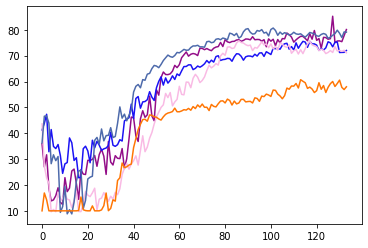

ROUND 133
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.060453


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.804379
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.571195
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.438747
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.802818

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Poor Channel, client not taken for averaging in this round

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.096710
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.659290
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.558162
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.602721
Model client15 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.467778

Power Allocated= 0
CSI= 0.06924706175061246
SNR= 31.71888971898994
Client: client16
Poor Channel, client not taken for averaging in this round

Power Allocated= 2.5798086952311756
CSI= 0.12259834493253474
SN

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.632035
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.709940
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.645913
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.237810

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.995940
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.806052
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.993348
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.512358
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.941882

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

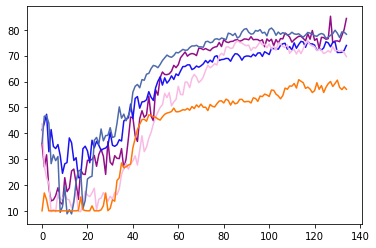

ROUND 134
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.010603


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.635513
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.428444
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.440297
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.189733

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.187573
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.626267
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.723152
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.627833
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.278692

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.139087
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.648466
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.524989
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.245732
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.484321
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.601518
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.313891
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.484397

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.971176
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.547521
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.686876
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.402288
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.414478

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

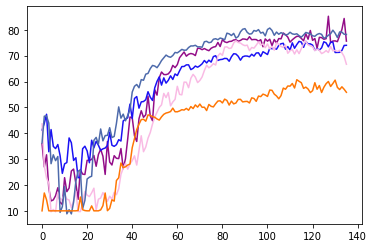

ROUND 135
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.050577


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.657846
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.414897
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.222682
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.424205

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.234251
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.803899
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.494804
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.663718
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.393544

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.336719
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.615471
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.626982
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.504588
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.597084
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.463820
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.460815
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.577093

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.028494
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.572190
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.986275
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.242726
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.898251

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

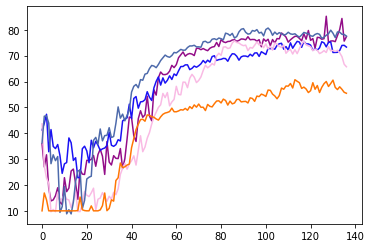

ROUND 136
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.050978


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.609620
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.554028
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.503306
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.902350

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215676
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.547579
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.503993
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.548785
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.982562

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.130931
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.549979
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.572374
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.052149
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.641935
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.818789
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.061572
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.824624

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.954151
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.627418
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.952778
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.097200
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.013369

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

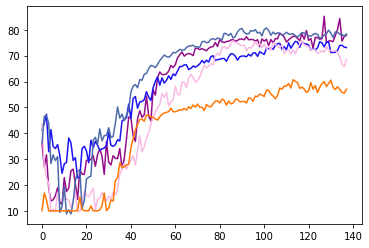

ROUND 137
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.110247


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.695299
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.502080
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.794490
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.420375

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.105771
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.800145
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.405358
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.978778
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.456454

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.141916
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.369094
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.785664
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.388337
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.979766
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.738774
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.481306
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.223428

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.004046
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.367024
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.320574
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.696319
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.687489

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

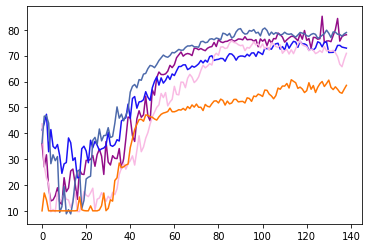

ROUND 138
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.993167


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.584314
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.853834
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.164951
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.852386

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.256948
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.496767
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.391858
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.457589
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.608440

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.118139
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.432578
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.557446
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.396020
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.864553
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.222049
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.387705
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.777333

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.106482
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.614057
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.727799
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.055257
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.111883

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

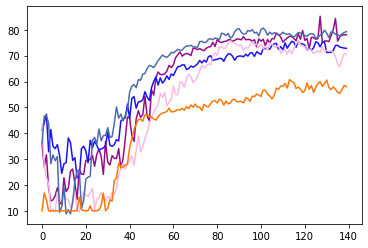

ROUND 139
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.046388


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.435099
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.507812
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.572449
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.046024

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.142125
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.624629
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.372560
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.690218
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.588159

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.131725
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.470340
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.440107
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.615064
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.786972
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.624076
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.407168
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.257385

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.046769
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.994123
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.169484
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.084774
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.057324

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

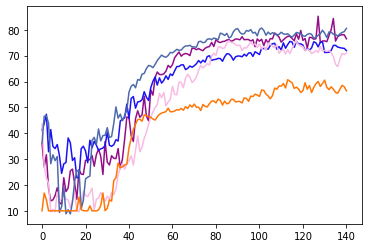

ROUND 140
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.944775


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.627538
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.593961
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.653958
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.933877

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.201062
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.517252
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.599397
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.018547
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.322727

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.154515
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.531618
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.673429
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.799461
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.494257
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.553970
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.664618
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.852243

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.919058
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.724222
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.543217
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.132467
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.927938

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

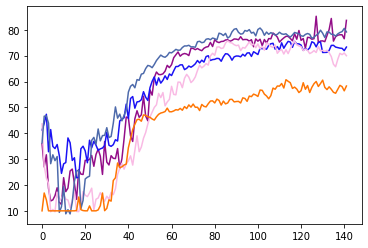

ROUND 141
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.017603


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.616434
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.798331
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.696834
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.294072

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.400134
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.710282
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.979759
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.907883
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.841306

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.200066
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.562924
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.544790
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.922286
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.668671
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.534034
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.268321
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.346390

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.010055
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.601498
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.709480
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.943604
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.969555

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

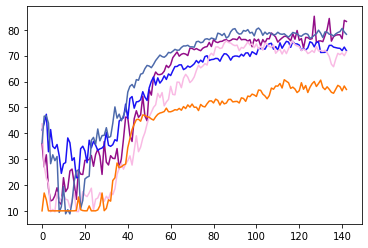

ROUND 142
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.028795


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.558679
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.437351
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.666882
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.688023

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.204722
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.597565
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.839215
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.653156
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.711382

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.259793
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.404440
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.364390
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.210274
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.439172
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.624144
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.832773
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.731132

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.973513
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.535152
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.547059
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.482548
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.930459

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

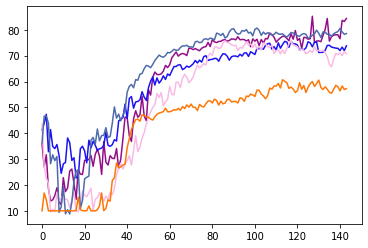

ROUND 143
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.058856


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.782803
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.766758
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.369623
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.100216

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.248285
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.003253
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.362103
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.630349
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.795421

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.329841
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.577372
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.477520
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.107845
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.926366
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.164107
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.065756
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.679716

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.008101
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.638107
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.636058
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.482551
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.404736

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

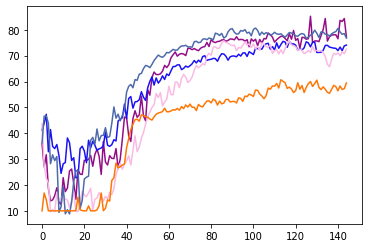

ROUND 144
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.990941


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.522789
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.862133
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.448001
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.670943

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.130157
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.577777
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.699218
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.884575
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.242223

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.227116
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.399706
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.598192
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.397651
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.648260
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.712525
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.351624
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.057318

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.007301
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.556650
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.473318
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.667890
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.666573

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

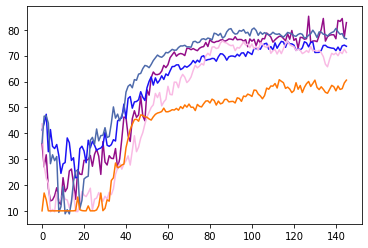

ROUND 145
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.879932


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.866588
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.771569
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.580683
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.507142

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.080110
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.880499
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.185604
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.465472
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.714396

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.163864
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.558280
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.617275
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.944089
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.805154
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.758851
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.378874
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.438515

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.956334
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.447559
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.423312
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.597271
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.133256

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

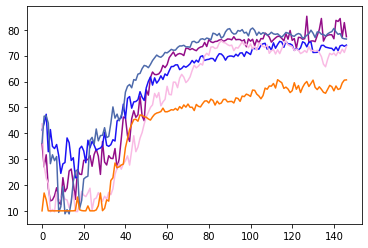

ROUND 146
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.948543


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.684156
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.660867
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.393320
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.782971

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.058547
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.588051
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.049796
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.038963
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.192124

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.105886
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628774
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.403892
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.555943
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.542618
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.099891
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.974136
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.860225

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.995110
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.552647
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.499498
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.812790
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.191438

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

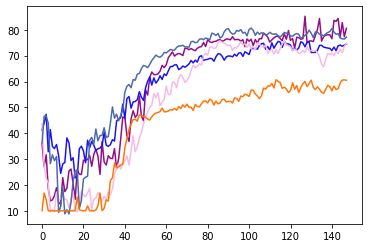

ROUND 147
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.045626


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.412567
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.491968
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.703610
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.430010

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.164677
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.782120
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.961679
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.154246
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.906138

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.149447
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.564517
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.591463
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.659881
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.697036
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.861741
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.948976
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.523889

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.923759
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.522343
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.600942
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 4.265270
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.890832

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

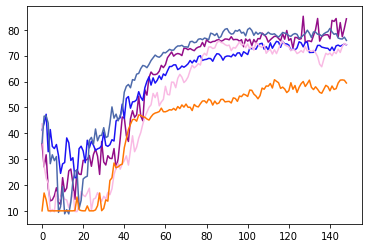

ROUND 148
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.933270


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.698695
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.485495
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.149494
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.838728

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.149108
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.597777
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.808298
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.111244
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.534459

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.148222
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.458463
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.368525
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.671158
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.832413
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.107787
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.545611
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.933163

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.904209
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.458132
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.544664
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.734478
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.705734

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

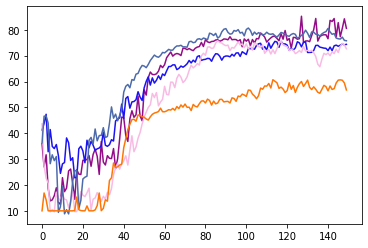

ROUND 149
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.003439


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.538812
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.256995
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.461736
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.633444

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.187244
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.513255
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.841450
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.493390
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.592849

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.134229
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.443556
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.425398
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.597336
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.709340
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.808334
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.779847
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.748763

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.895014
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.812301
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.739318
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.131847
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.496493

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

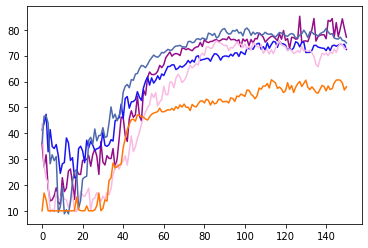

ROUND 150
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.898768


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.653319
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.708539
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.798075
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.348348

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.186956
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.716450
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.808311
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.488278
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.432498

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.168517
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.337398
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.322231
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.145845
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.993957
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.792333
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.936661
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.333126

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.973111
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.654113
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.517356
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.053800
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.235067

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

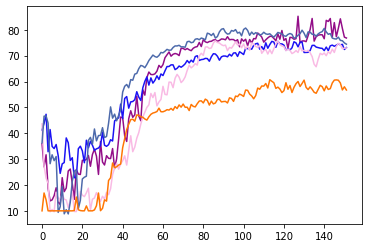

ROUND 151
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.885974


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.483363
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.689141
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.993260
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.397226

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.184083
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.577156
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.550388
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.875870
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.364931

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.116907
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.488598
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.806155
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.662106
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.619642
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.857077
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.434960
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.342658

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.894273
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628310
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.733748
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.673531
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.065093

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

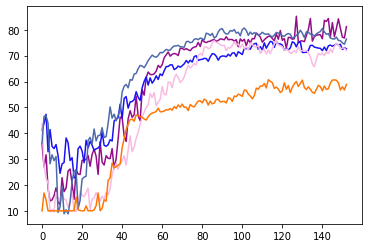

ROUND 152
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.029841


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.944505
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.486962
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.051002
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.649669

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.210100
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.526081
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.604147
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.648394
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.619149

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.047141
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.399559
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.329688
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.530648
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.739417
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.710242
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.776404
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.837558

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.922647
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.689298
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.997831
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.446526
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.736196

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

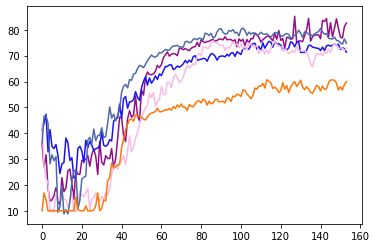

ROUND 153
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.992508


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.781592
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.346753
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.669577
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.634014

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.090718
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.934020
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.695825
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.028150
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.089998

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.136599
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.465639
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.947955
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.370378
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.834678
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.159246
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.873520
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.243373

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.798352
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.515031
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.575747
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.953934
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.324376

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

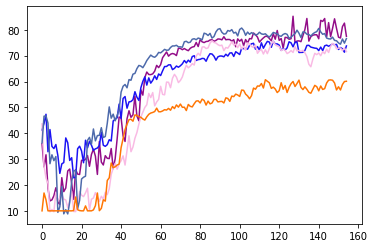

ROUND 154
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.094885


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.678765
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.802547
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.554619
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.363393

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.215350
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.121392
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.284574
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 3.893120
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.337896

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.182012
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.515987
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.479400
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.010721
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.978632
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.867139
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.109959
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.518517

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.910169
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.429477
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.653412
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.272668
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.661033

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

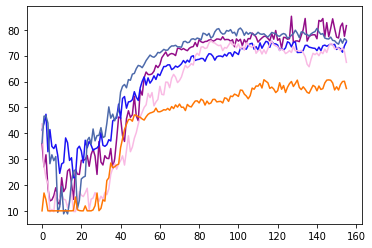

ROUND 155
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.901351


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628590
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.424720
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.273190
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.269993

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.128477
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.040920
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.657672
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.679565
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.466110

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.157900
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.581607
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.289736
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.905015
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.069243
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.164993
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.050556
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.902298

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.908088
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.417572
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.386655
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.443167
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.019931

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

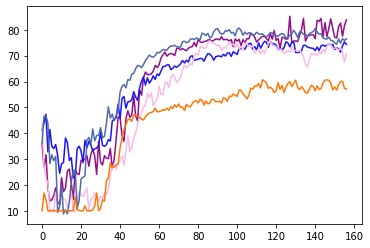

ROUND 156
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.000768


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.572017
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.848840
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.507782
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.303509

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.304534
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.566836
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.849785
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.087030
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.486548

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.112056
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628495
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.746195
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.798560
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.247181
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.247347
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.167752
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.262978

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.862742
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.548084
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.457865
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.639835
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.728566

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

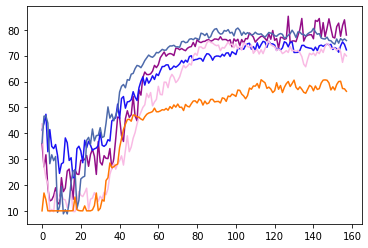

ROUND 157
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.926155


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.593967
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.608866
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.075502
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.407297

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.361536
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.423772
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.521667
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.742155
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.466722

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.105394
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.518938
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.366949
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.978628
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.930023
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.941931
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.500932
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.348464

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.883639
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.471064
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.573997
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.519310
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.243690

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

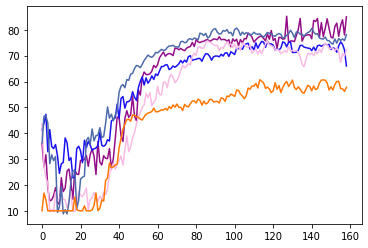

ROUND 158
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.969931


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.656057
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.414815
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.747733
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.999267

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.055689
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.828292
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.853812
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.776827
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.331898

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.005259
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.490820
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.407591
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.515661
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.144809
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.073979
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.799262
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.602291

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.831784
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.386045
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.644602
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.275279
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.469251

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

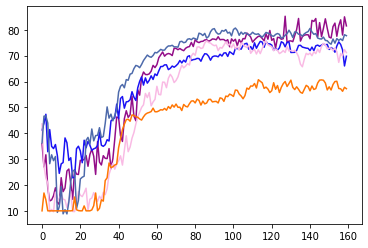

ROUND 159
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.994900


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.894582
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.739693
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.561706
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.449504

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.114497
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.649613
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.106812
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.761623
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.434097

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.943127
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.613620
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.557061
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.960023
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.781304
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.037496
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.374289
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.546471

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.731062
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.566325
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.588931
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.087915
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.943118

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

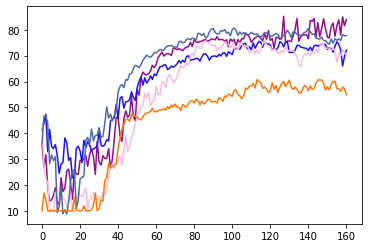

ROUND 160
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.024778


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.514810
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.926106
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.964222
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.957513

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.187761
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.694965
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.681422
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.668779
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.724057

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.067162
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.530543
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.826371
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.365548
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.855003
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.719126
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.984179
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 8.490417

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.960410
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.384412
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.482957
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.300543
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.903359

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

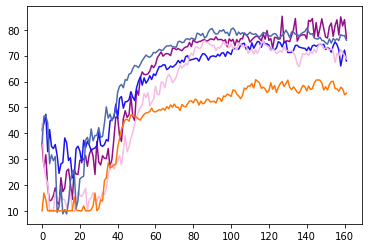

ROUND 161
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.025263


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.687093
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.866334
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.874495
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.156844

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.081812
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.509808
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.569923
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.615250
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.788079

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.195751
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.634136
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.538743
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.466993
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.745611
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.840337
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.279334
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.434577

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.926690
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.668927
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.640383
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.634692
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.824891

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

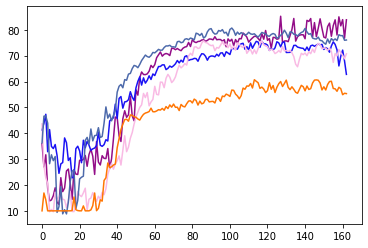

ROUND 162
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.811931


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.616623
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.478400
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.786233
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.828731

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.260733
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.755166
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.909485
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.202538
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.224489

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.179161
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.510066
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.586765
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.749091
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.563316
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.155994
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.537851
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.098054

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.880702
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.512135
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.466485
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.897774
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.352018

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

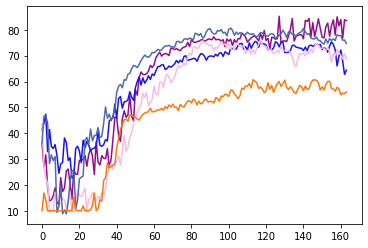

ROUND 163
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.795824


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.707512
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.763624
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.018039
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.224744

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.016377
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.743234
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.686857
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.031859
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.885512

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.050366
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.387396
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.619773
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.362778
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.680166
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.149646
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.842336
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.895739

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.885476
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.544035
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.556038
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.560023
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.865543

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

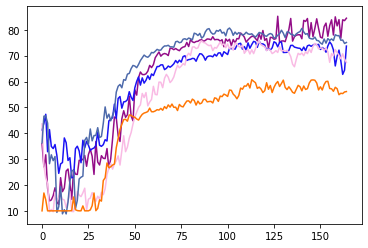

ROUND 164
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.888643


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.652409
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.733044
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.393143
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.659994

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.341222
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.549629
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.438769
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.551255
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.218774

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.139216
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.349066
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.419715
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.576336
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.572338
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.671714
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.120378
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.692844

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.054198
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.757679
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.155618
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.575025
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.155288

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

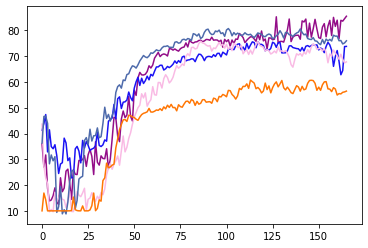

ROUND 165
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.836323


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.545956
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.399718
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.746828
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.165718

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.316574
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.104760
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.923583
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.911802
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.896427

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.127670
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.839747
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.635264
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.785000
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.852071
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.970442
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.131903
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 5.513295

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.808545
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.481888
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.683730
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.616205
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.935589

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

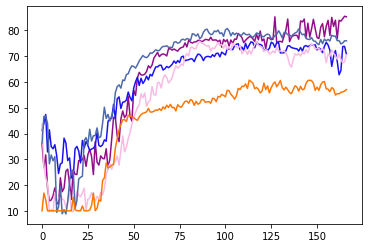

ROUND 166
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.864816


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.468322
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.905171
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.094553
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.140533

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.238099
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.556335
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.506735
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.020289
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.684520

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.059759
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.339537
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.533316
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.817528
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.646360
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.070765
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.986373
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.294806

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.897596
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.394803
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.351843
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.540886
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.293052

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

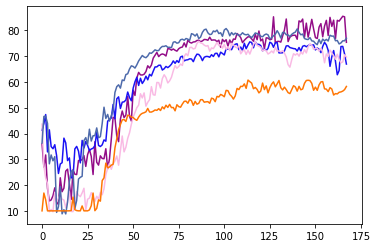

ROUND 167
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.044217


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.797165
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.820645
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.802532
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.143183

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.164152
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.619820
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.649467
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.700603
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.479612

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.026319
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.584712
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.571019
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.569246
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.678958
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.994981
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.852130
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.943273

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.975200
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.525439
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.616155
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.057043
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.213269

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

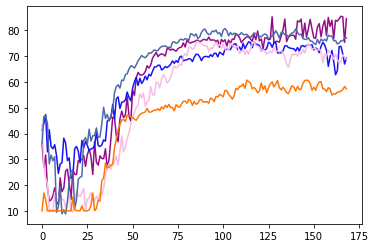

ROUND 168
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.945938


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.950950
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.303788
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.969235
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.148583

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.024234
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.596590
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.809596
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.977822
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.113230

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.182487
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.676054
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.765096
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.797157
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.930508
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.868249
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.854487
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.982081

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.791494
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.445746
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.646034
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.586015
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.168178

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

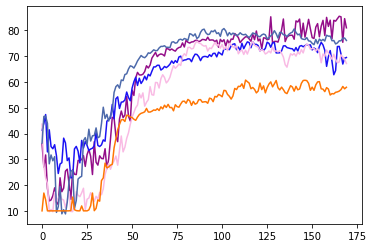

ROUND 169
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.933939


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.419551
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.880651
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.346365
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.676973

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.006469
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.602247
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.255022
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.798919
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.620612

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.895609
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.945777
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.496399
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.713673
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.865179
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.733514
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.821412
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.687508

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.901734
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.413527
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.627052
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.475026
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.578704

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

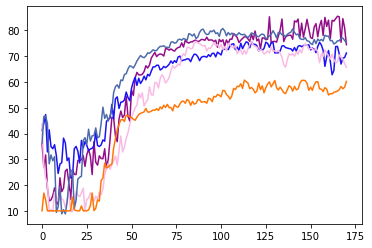

ROUND 170
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.975851


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.650883
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.718883
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.052915
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.777867

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.099927
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.716646
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.740734
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.448571
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.558594

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.090372
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.411967
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.552719
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.558150
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.731592
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.611777
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.827542
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.865569

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.802324
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.715088
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.736048
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.030674
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.769535

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

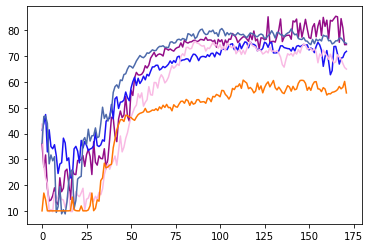

ROUND 171
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.111881


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.667439
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.332640
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.928906
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.583338

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.186896
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.419309
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.400291
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.513878
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.604419

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.144012
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.705812
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.688053
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.991902
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.913708
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.204638
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.098729
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.215778

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.942842
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.568548
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.093926
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.089598
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.803281

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

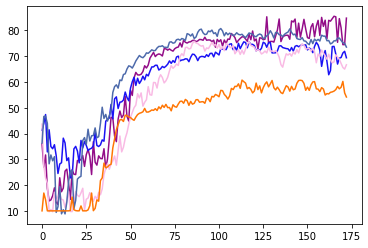

ROUND 172
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.902858


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.721119
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.753101
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.293745
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.230874

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.282415
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.785062
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.574221
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.154044
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.575986

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.152841
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.004147
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.918108
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.610620
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.743842
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.813154
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.890177
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.678726

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.831027
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.751987
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.014087
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.538677
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.502312

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

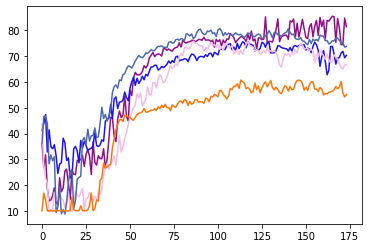

ROUND 173
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.893816


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.658791
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.646702
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.522367
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.572303

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.306517
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.749379
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.542398
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.248658
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.295075

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.110331
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.460537
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.409955
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.784511
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.814061
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.114171
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 3.542237
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.265108

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.957886
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.649406
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.381662
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.425754
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.279778

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

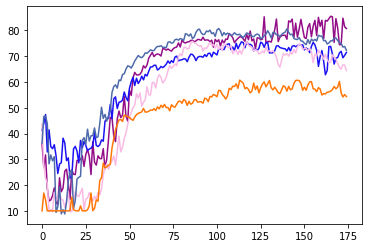

ROUND 174
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.066712


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.919400
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.614834
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.596039
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.679979

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.278076
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.470327
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.648417
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.539103
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.758530

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.005857
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.381015
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.787825
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.138762
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.741381
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.034052
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.304211
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.090217

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.860385
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.533047
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.999045
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.976913
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.011215

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

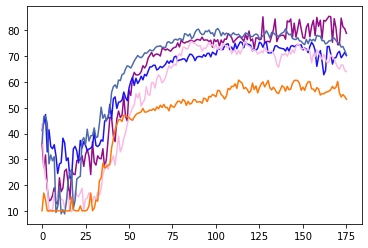

ROUND 175
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.981299


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.868702
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.729054
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.526707
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.615225

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.088801
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.699969
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.860340
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.422828
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.804045

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.028404
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.482905
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.457377
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.776498
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.817647
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.191590
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.833801
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.094666

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.871261
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.821783
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.661940
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.784024
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.657931

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

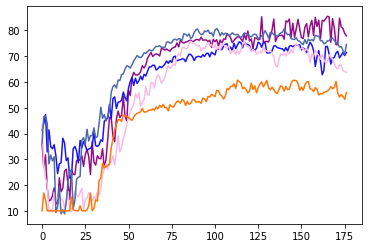

ROUND 176
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.958386


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.692408
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.612946
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.912986
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.222309

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.189777
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.582522
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.470584
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.407093
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.348116

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.133766
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.715107
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.891790
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.624274
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.782231
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.874624
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.624810
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.060762

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.913372
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.303229
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.606588
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.689066
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.898551

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

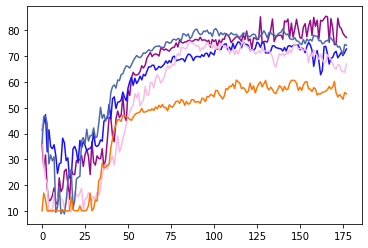

ROUND 177
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.997485


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.396555
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.426397
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.142059
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.360174

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.183312
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.614532
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.049135
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.056838
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.803384

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.173808
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.638435
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.687992
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.812399
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.693688
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.707581
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 3.117996
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.050158

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.903310
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.402055
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.259460
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.791073
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.401196

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

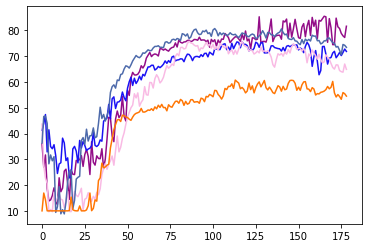

ROUND 178
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.019872


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.771829
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.686936
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.475555
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.566243

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.979239
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.718759
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.907611
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.006818
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.246939

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.175884
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.346504
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.208803
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.552710
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.757284
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.851057
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.387365
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.547321

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.874557
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.579007
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.198795
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.782871
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.306203

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

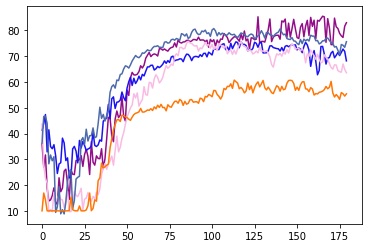

ROUND 179
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.929905


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.742272
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.607622
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.715490
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.278171

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.993890
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.696681
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.939323
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.125376
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.907314

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.230806
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.447728
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.618754
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.465307
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.154142
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.341835
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.586433
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.380744

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.821822
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.356689
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.907116
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.974594
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.334045

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

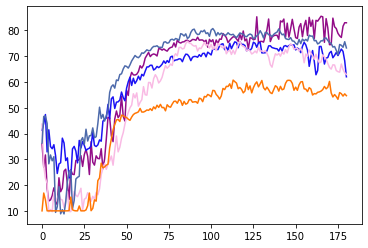

ROUND 180
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.995979


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.662295
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.460300
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.863786
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.368884

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.254752
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.797738
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.763613
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.111703
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.677134

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.025333
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.361689
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.717745
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.250838
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.949726
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.359076
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.423979
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.125197

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.095776
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.591798
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.839323
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.129781
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.178138

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

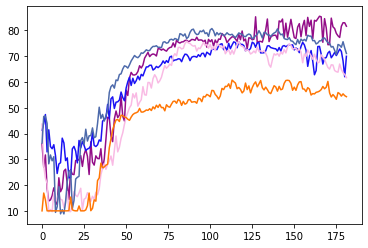

ROUND 181
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.009587


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.643517
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.415957
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.553557
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.699736

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.118419
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.195619
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.452498
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.012194
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.782180

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.877503
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.704401
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.086087
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.987335
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.853484
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.869737
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.138169
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.197291

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.844223
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.494169
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.347402
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.806987
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.130213

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

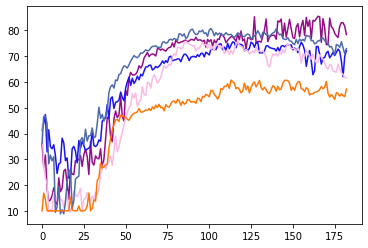

ROUND 182
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.915089


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.491179
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.478824
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.664131
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.556891

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.194314
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.370682
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.666787
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.637849
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.395899

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.173213
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.928340
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.061157
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.953345
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.813385
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.079104
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.769227
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 5.826954

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.965619
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.370484
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.442029
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.043457
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.109788

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

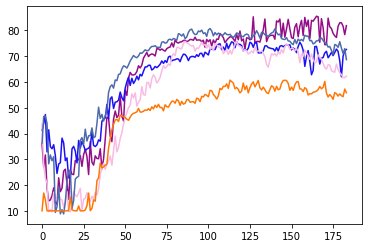

ROUND 183
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.904426


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.813736
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.958805
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.606712
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.815272

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.167325
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.354763
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.257585
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.398093
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.816991

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.325104
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.738861
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.570853
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.978442
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.952993
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 2.205479
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 3.644311
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.483668

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.981365
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.472202
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.450054
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.001335
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.778576

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

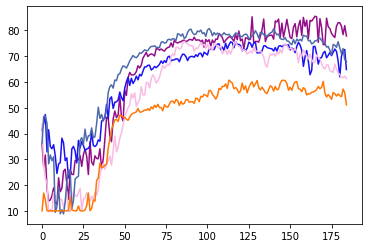

ROUND 184
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.966903


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.638490
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.955443
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.851641
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.711318

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.241108
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.968901
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.880029
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.796391
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.422656

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.057180
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.554816
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.519201
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.634910
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.770728
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.319419
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.166728
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.591190

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.843491
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.709328
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.544890
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.808466
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.035080

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

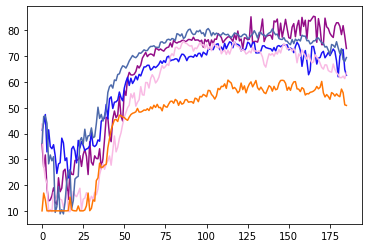

ROUND 185
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.834393


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.719106
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.905844
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.265700
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.183606

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.118868
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.901040
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.914046
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.772221
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.090838

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.247263
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.696482
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.613874
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.600140
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.837563
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.130096
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.824321
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.969619

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.822816
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.403477
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.166942
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.528200
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.625977

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

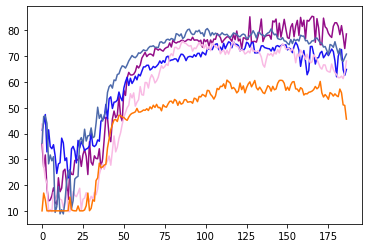

ROUND 186
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.799195


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.629802
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.986252
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.626490
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.347104

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.019279
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.748677
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.996942
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.298016
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.560261

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.972774
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.998547
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.873560
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.694101
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.784521
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.028991
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.989896
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.620004

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.862639
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.510633
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.854282
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.891012
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.985412

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

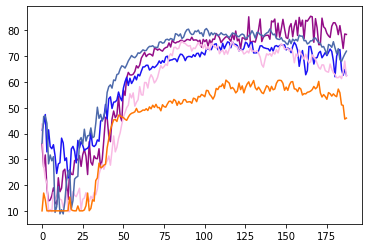

ROUND 187
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.977435


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.998352
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.223067
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.808767
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.348629

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.153877
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.810779
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.717439
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.838074
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.826777

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.963235
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.920186
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.837982
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 5.569962
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.468002
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.708917
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.181710
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.047786

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.808614
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.402834
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.712616
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.418250
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.643116

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

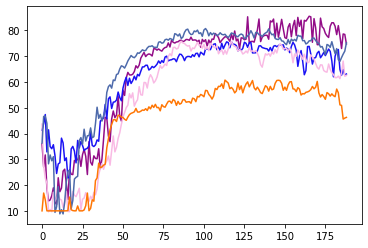

ROUND 188
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.998690


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.566022
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.597376
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.818440
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.182117

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.124590
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.464182
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.595610
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.804738
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.717459

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.074901
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.693134
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.923408
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.980631
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.646356
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.226733
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.908240
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.921625

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.851060
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.410129
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.648379
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.583186
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.816565

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

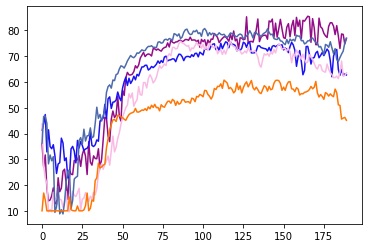

ROUND 189
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.886313


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.654360
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.644662
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.117555
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.729258

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.039755
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.632159
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.734711
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.081049
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.004018

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.049312
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.750868
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.863862
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.776116
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.808620
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.122301
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.708225
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.378558

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.985296
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.564476
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.575549
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.725247
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.279570

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

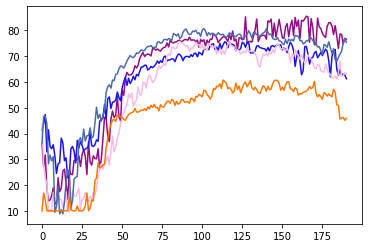

ROUND 190
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.861264


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.716896
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.779171
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.831964
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.199892

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.224078
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.727674
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.927642
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.873127
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.690295

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.896479
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.430713
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.628790
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.350172
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.579519
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.632195
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.811322
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.162261

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.012842
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.693227
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.500380
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.129390
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.232671

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

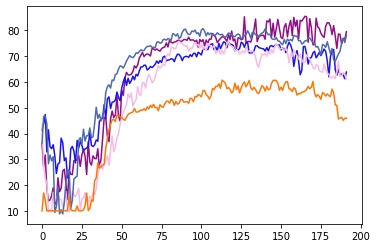

ROUND 191
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.024858


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.576958
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.619381
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.259455
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.783363

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.092826
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.503516
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.044227
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.946293
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.906738

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.092468
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.805286
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.951495
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.618598
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.620518
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.035204
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.193040
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.948624

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.752728
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.921088
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.029624
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.041033
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.614631

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

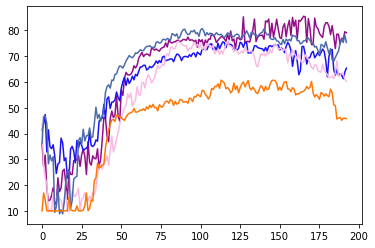

ROUND 192
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.860593


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.464452
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.540164
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.507718
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.755758

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.153865
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.675724
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.142148
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.245572
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.481690

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.015075
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.682692
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.692213
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.113217
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.361317
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.297345
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.410295
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.904887

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.878313
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.505343
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.667392
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.891640
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.198533

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

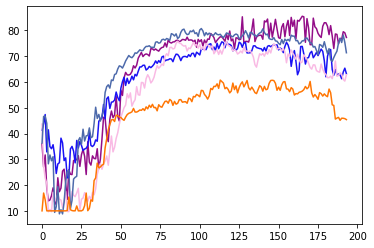

ROUND 193
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.991931


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.499975
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.452138
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.939854
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.312128

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.324184
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.504705
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.977815
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.103764
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.714151

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.093780
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.628818
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.747502
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.800311
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.929592
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.052161
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.298736
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.920192

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.902828
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.690284
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.491325
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.885077
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.303551

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

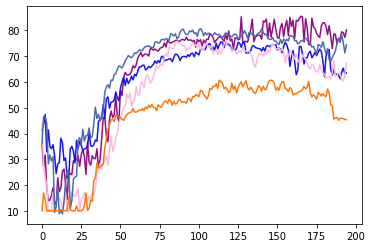

ROUND 194
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.996203


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.580949
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.766553
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.787438
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.626721

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.995499
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.931304
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.767870
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.811434
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.745544

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.137717
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.643404
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.873422
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.979186
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.547234
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.471800
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 3.219145
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 4.338356

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.958389
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.621849
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.501878
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.720503
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.782821

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

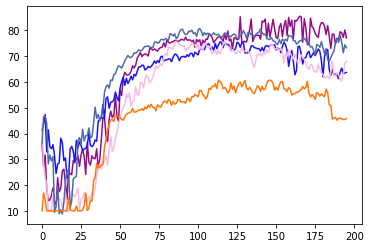

ROUND 195
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.794647


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.725933
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.602003
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 2.576528
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.823083

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.122581
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.578991
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.696424
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.243619
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.497856

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.951198
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.664533
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.571604
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.726171
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.586594
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.139934
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.309130
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.051899

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.926144
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.457292
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.576383
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.732945
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.678493

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

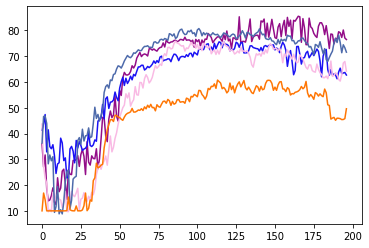

ROUND 196
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.903542


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.974901
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.899288
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.374453
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 2.289730

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.177103
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.037023
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.585981
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.971573
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.090065

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.131840
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.448065
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.607948
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.991861
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.755402
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.863676
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.253522
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.085265

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.841899
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.705187
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.505333
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.703560
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 0.610451

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

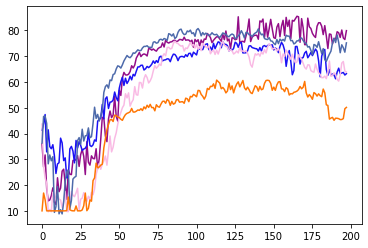

ROUND 197
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.952279


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.529580
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.215666
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.733355
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.969363

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.163109
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.799578
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.993317
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.369982
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.524699

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.047777
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.633416
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.669678
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.905401
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.973191
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.853890
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.606866
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.181855

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.865104
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.635774
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.778102
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.004356
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.678470

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

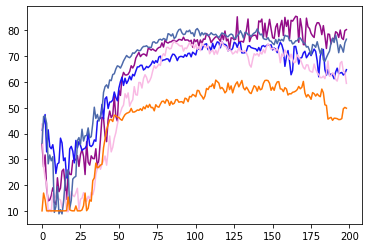

ROUND 198
0.09314000000000817
Power Allocated= 9.570788244571956
CSI= 0.8578261163380628
SNR= 26.09412398998044
Client: client11
Model client11 Train Epoch: 1 [0/1216 (0%)]	Loss: 1.936660


/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/hook/hook.py:560: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  current_tensor = hook_self.torch.native_tensor(*args, **kwargs)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:414: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  response = command_method(*args_, **kwargs_)
/home/test/anaconda3/lib/python3.7/site-packages/syft/frameworks/torch/tensors/interpreters/native.py:156: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you a

Model client11 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.944234
Model client11 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.532755
Model client11 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.679716
Model client11 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.311620

Power Allocated= 9.055321997537902
CSI= 0.5948119327552587
SNR= 24.602390851329588
Client: client14
Model client14 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.204841
Model client14 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.715540
Model client14 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.894801
Model client14 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.741976
Model client14 Train Epoch: 5 [0/1216 (0%)]	Loss: 3.239889

Power Allocated= 6.457459133088873
CSI= 0.23369582913515163
SNR= 27.05947993020125
Client: client15
Model client15 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.087651
Model client15 Train Epoch: 2 [0/1216 (0%)]	Loss: 1.180563
Model client15 Train Epoch: 3 [0/1216 (0%)]	Loss: 1.345277
Model client15 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.239371
Model client15 Train Epoch: 5 [

/home/test/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide


Model client17 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.669399
Model client17 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.673488
Model client17 Train Epoch: 4 [0/1216 (0%)]	Loss: 0.921657
Model client17 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.434254

Power Allocated= 0
CSI= 0.08622473271666897
SNR= 43.44051248823216
Client: client22
Poor Channel, client not taken for averaging in this round

Power Allocated= 0
CSI= 0.04366028287030821
SNR= 47.467728213715354
Client: client30
Poor Channel, client not taken for averaging in this round

Power Allocated= 7.394022272522015
CSI= 0.2991769592988075
SNR= 38.57435824676835
Client: client37
Model client37 Train Epoch: 1 [0/1216 (0%)]	Loss: 2.018615
Model client37 Train Epoch: 2 [0/1216 (0%)]	Loss: 0.614472
Model client37 Train Epoch: 3 [0/1216 (0%)]	Loss: 0.846930
Model client37 Train Epoch: 4 [0/1216 (0%)]	Loss: 1.032467
Model client37 Train Epoch: 5 [0/1216 (0%)]	Loss: 1.820079

Power Allocated= 9.417493130961445
CSI= 0.7581314165958895
SNR= 19.276730249662

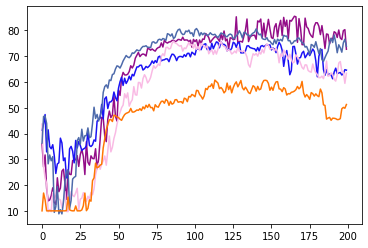

ROUND 199


In [14]:
for client in clients: #give the model and optimizer to every client
    torch.manual_seed(args.torch_seed)
    client['model'] = Net().to(device)
    #client['model'] = torch.quantization.quantize_dynamic(
    #client['model'],  # the original model
    #{torch.nn.Linear},  # a set of layers to dynamically quantize
    #dtype=torch.fp)  # the target dtype for quantized weights
    client['optim'] = optim.SGD(client['model'].parameters(), lr=args.lr)

final_acc=[]
final_loss=[]
clor = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for i in range(args.numclusters)]   
for fed_round in range(args.rounds):
    overall=Net()
    if(fed_round==0): #fed_round==0
        arranged_clusters,head_snr_list=cluster_former(args.numclusters,args.clients)
        temp=deepcopy(arranged_clusters)
        temp2=deepcopy(head_snr_list)
    else:
        #print(temp)
        arranged_clusters=deepcopy(temp)
        head_snr_list=deepcopy(temp2)
#     print(arranged_clusters)
    
    no=1
    heads_list=[]
    weights=[]
    weight_head_list=[]
    head_acc=[]
    head_loss=[]
    for cluster in arranged_clusters:
        
        head=cluster['Cluster Head']
        members=cluster['Members']
        snrs=cluster['SNR']
        csis=cluster['CSI']
        weights.append(sum(snrs))
        weight_head_list.append([head,sum(snrs)])
        new_members=[]
        
        for ij in members:
        #print(ij)
            cl_no=int(ij[6:])
            new_members.append(clients[cl_no-1])
#         print(head)
        head=clients[int(head[6:])-1]
        cluster['Members']=new_members
#         print(head)

        smallmu1=0
        gsmall1=3.402823466E+38 
        
        #water filling algorithm
        mu=1e-15
        while(mu<=1):
            g1=0
            pn1=0
            for jj in csis:
                pn=max(1/mu-1/jj,0)
                g1+=math.log(1+pn*jj) #capacity of a channel (shannon's law)
                pn1+=pn
            g=g1-mu*(pn1-P*30)
            if(g<gsmall1):
                smallmu1=mu
                gsmall1=g
            mu+=0.00002
        
        print(smallmu1)
        good_mem=[]
#         print(len(snrs))
#         print(len(csis))
#         print(len(new_members))
        index=0
        for client in new_members:
            goodchannel=ClientUpdate(args, device, client,key_np,key,snrs[index],csis[index],smallmu1,head)
            index+=1
            if(goodchannel):
                good_mem.append(client)
        
        head['model']=averageModels(head['model'], good_mem)
        arr=test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)
        ac=arr[0]#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[0]
        no+=1
        heads_list.append(head)
        head_acc.append(ac)
        head_loss.append(arr[1])#test(args,head['model'], device, global_test_loader, 'Cluster'+str(no),fed_round)[1])
    
    final_acc.append(head_acc)
    final_loss.append(head_loss)
    fig,ax=plt.subplots()
    
    #ax.plot([i for i in range(fed_round)],head_acc[0])
    for jj in range(0,args.numclusters):
        
        ax.plot([i for i in range(len(final_acc))],[final_acc[j][jj] for j in range(len(final_acc))], color = clor[jj])
        
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][0] for j in range(len(final_acc))], color ="red")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][1] for j in range(len(final_acc))],color ="blue")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][2] for j in range(len(final_acc))],color ="green")
    #ax.plot([i for i in range(len(final_acc))],[final_acc[j][3] for j in range(len(final_acc))],color ="black")
    #ax.plot([i for i in range(len(final_acc))],head_acc[1], fed_round, color ="blue")
    #ax.plot([i for i in range(len(final_acc))],head_acc[2], fed_round, color ="green")
    #ax.plot([i for i in range(len(final_acc))],head_acc[3], fed_round, color ="black")
    
    
    plt.show()
    weightsum=sum(weights)
    
    weights[:] = [x / weightsum for x in weights]
    for aah in range(len(weight_head_list)):
        weight_head_list[aah][1]=weights[aah]
    final_heads,nets=decentralized(heads_list,head_snr_list,weight_head_list)
    
    for head in range(len(final_heads)):
        for cluster in arranged_clusters:
            head1=cluster['Cluster Head']
            if(head1==final_heads[head]['hook'].id):
                for mem in cluster['Members']:
                    mem['model'].load_state_dict(nets[head].state_dict())
    print("ROUND",fed_round)

In [15]:
print(final_acc)

[[35.98, 41.31, 43.67, 36.34, 10.09], [27.06, 43.87, 27.44, 46.63, 16.98], [31.73, 47.37, 22.76, 46.71, 14.34], [18.76, 32.9, 20.69, 43.95, 10.09], [13.91, 41.46, 9.74, 28.29, 10.09], [14.31, 34.97, 10.61, 31.72, 10.09], [15.94, 34.13, 9.74, 29.46, 10.09], [19.0, 35.69, 17.32, 31.06, 10.09], [13.41, 31.45, 13.92, 9.49, 10.09], [12.55, 24.55, 14.86, 11.7, 10.09], [22.89, 28.22, 16.57, 19.44, 10.09], [17.5, 28.73, 14.57, 8.93, 10.09], [18.88, 38.23, 14.29, 10.53, 10.12], [25.47, 36.38, 11.33, 8.9, 10.09], [26.22, 29.54, 14.07, 13.46, 10.09], [20.64, 30.59, 17.55, 21.48, 10.09], [14.52, 22.86, 9.85, 25.42, 10.22], [25.98, 23.01, 9.8, 25.82, 15.43], [24.27, 34.06, 12.89, 10.93, 10.52], [24.12, 35.04, 17.55, 14.11, 10.19], [29.59, 33.21, 16.14, 22.39, 10.09], [29.57, 28.66, 15.58, 23.07, 10.1], [29.93, 37.35, 17.03, 23.46, 11.99], [31.46, 34.42, 18.83, 37.3, 10.09], [27.29, 36.95, 10.42, 38.44, 10.1], [31.86, 35.42, 14.57, 35.83, 10.09], [33.88, 33.44, 15.04, 41.69, 10.45], [31.18, 34.02, 1